# pop_decoding3

In [1]:
# General
import sys
import os.path as op
from time import time
from collections import OrderedDict as od
from glob import glob
import itertools
import warnings
from importlib import reload

# Scientific
import numpy as np
import pandas as pd
pd.options.display.max_rows = 100
pd.options.display.max_columns = 999

# Stats
import statsmodels.api as sm
from sklearn.utils.fixes import loguniform
import scipy.stats as stats
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import minmax_scale, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import confusion_matrix

# Plots
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import matplotlib as mpl
from matplotlib.lines import Line2D
import matplotlib.patches as patches
# from mpl_toolkits.mplot3d import Axes3D
mpl.rcParams['grid.linewidth'] = 0.1
mpl.rcParams['grid.alpha'] = 0.75
mpl.rcParams['lines.linewidth'] = 1
mpl.rcParams['lines.markersize'] = 3
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12
mpl.rcParams['xtick.major.width'] = 0.8
mpl.rcParams['ytick.major.width'] = 0.8
colors = ['1f77b4', 'd62728', '2ca02c', 'ff7f0e', '9467bd', 
          '8c564b', 'e377c2', '7f7f7f', 'bcbd22', '17becf']
mpl.rcParams['axes.prop_cycle'] = mpl.cycler('color', colors)
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.formatter.offset_threshold'] = 2
mpl.rcParams['axes.labelsize'] = 14
mpl.rcParams['axes.labelpad'] = 8
mpl.rcParams['axes.titlesize'] = 16
mpl.rcParams['axes.grid'] = False
mpl.rcParams['axes.axisbelow'] = True
mpl.rcParams['legend.loc'] = 'upper right'
mpl.rcParams['legend.fontsize'] = 14
mpl.rcParams['legend.frameon'] = False
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['figure.titlesize'] = 16
mpl.rcParams['figure.figsize'] = (10, 4) 
mpl.rcParams['figure.subplot.wspace'] = 0.25 
mpl.rcParams['figure.subplot.hspace'] = 0.25 
mpl.rcParams['font.sans-serif'] = ['Helvetica']
mpl.rcParams['savefig.format'] = 'pdf'
mpl.rcParams['pdf.fonttype'] = 42

# Personal
sys.path.append('/home1/dscho/code/general')
sys.path.append('/home1/dscho/code/projects/manning_replication')
sys.path.append('/home1/dscho/code/projects')
import data_io as dio
import array_operations as aop
from eeg_plotting import plot_trace, plot_trace2
from time_cells import spike_sorting, spike_preproc, events_preproc, events_proc, time_bin_analysis, pop_decoding

font = {'tick': 12,
        'label': 14,
        'annot': 12,
        'fig': 16}

# Colors
n = 4
c = 2
colors = [sns.color_palette('Blues', n)[c], 
          sns.color_palette('Reds', n)[c], 
          sns.color_palette('Greens', n)[c],
          sns.color_palette('Purples', n)[c],
          sns.color_palette('Oranges', n)[c],
          sns.color_palette('Greys', n)[c],
          sns.color_palette('YlOrBr', n+3)[c],
          'k']
cmap = sns.palettes.blend_palette((colors[0], 
                                   'w',
                                   colors[1]), 501)

colws = od([('1', 6.55),
            ('2-1/2', 3.15),
            ('2-1/3', 2.1),
            ('2-2/3', 4.2),
            ('3', 2.083),
            ('4', 1.525),
            ('5', 1.19),
            ('6', 0.967),
            (1, 2.05),
            (2, 3.125),
            (3, 6.45),
            ('nat1w', 3.50394),
            ('nat2w', 7.20472),
            ('natl', 9.72441)])

proj_dir = '/home1/dscho/projects/time_cells'

In [2]:
# Get sessions.
sessions = np.unique([op.basename(f).split('-')[0] 
                      for f in glob(op.join(proj_dir, 'analysis', 'events', '*-Events.pkl'))])
print('{} subjects, {} sessions'.format(len(np.unique([x.split('_')[0] for x in sessions])), len(sessions)))

10 subjects, 12 sessions


In [10]:
# Get spike counts in each time bin, for all neurons in the study.
pop_spikes = pop_decoding.load_pop_spikes()

print(pop_spikes)

457 neurons
500 ms time bins
36 trials
160 time bins/trial
pop_spikes: (5760, 460)


In [4]:
load_single_file = True

start_time = time()

# Load all time OLS result files.
filename = op.join(proj_dir, 'analysis', 'unit_to_behav', 'all_units_time',
                   'ols-time_bin-model_pairs-457units.pkl')
if load_single_file and op.exists(filename):
    ols_pairs = dio.open_pickle(filename)
else:
    ols_pairs_files = glob(op.join(proj_dir, 'analysis', 'unit_to_behav', '*-time_bin-model_pairs.pkl'))
    print('Found OLS outputs for {} neurons'.format(len(ols_pairs_files)))

    warnings.filterwarnings('ignore')
    bad_files = []
    ols_pairs = pd.DataFrame([])
    for filename in ols_pairs_files:
        try:
            ols_pairs = pd.concat((ols_pairs, dio.open_pickle(filename)))
        except:
            bad_files.append(filename)
    ols_pairs = ols_pairs.sort_values(['subj_sess', 'neuron']).reset_index(drop=True)
    warnings.resetwarnings()

    # Restrict dataframe rows to navigation periods.
    keep_cols = ['subj_sess', 'neuron', 'gameState', 'testvar', 'full', 'llf_full', 'lr', 'z_lr', 'emp_pval']
    # ols_pairs = ols_pairs.query("(gameState==['Encoding', 'Retrieval'])")[keep_cols].reset_index(drop=True)
    ols_pairs = ols_pairs[keep_cols].reset_index(drop=True)

    # Organize categorical columns.
    test_vars = ['time', 'place', 'head_direc', 'is_moving', 'base_in_view', 'gold_in_view', 'dig_performed']
    test_var_cat = pd.CategoricalDtype(test_vars, ordered=True)
    ols_pairs['testvar'] = ols_pairs['testvar'].astype(test_var_cat)

#     full_models = ['time', 'time_place', 'full']
#     full_model_cat = pd.CategoricalDtype(full_models, ordered=True)
#     ols_pairs['full'] = ols_pairs['full'].astype(full_model_cat)

    # Add new columns.
    roi_map = spike_preproc.roi_mapping(n=3)
    val_map = od([('hem', []),
                  ('roi', []),
                  ('roi_gen', []),
                  ('spike_mat'        , []),
                  ('mean_frs'         , []),
                  ('sem_frs'          , []),
                  ('fr_mean'          , []),
                  ('fr_max'           , []),
                  ('fr_max_ind'       , []),
                  ('sparsity'         , [])])
    for idx, row in ols_pairs.iterrows():
        if 'event_spikes' not in dir():
            event_spikes = time_bin_analysis.load_event_spikes(row['subj_sess'], verbose=False)
        elif event_spikes.subj_sess != row['subj_sess']:
            event_spikes = time_bin_analysis.load_event_spikes(row['subj_sess'], verbose=False)
        hemroi = spike_preproc.roi_lookup(row['subj_sess'], row['neuron'].split('-')[0])
        hem = hemroi[0]
        roi = hemroi[1:]
        roi_gen = roi_map.get(roi, np.nan)
        spike_mat = event_spikes.get_spike_mat(row['neuron'], row['gameState'])
        mean_frs = time_bin_analysis.get_mean_frs(spike_mat) * 2
        sem_frs = time_bin_analysis.get_sem_frs(spike_mat) * 2
        fr_mean = np.mean(mean_frs.values)
        fr_max = np.max(mean_frs.values)
        fr_max_ind = np.argmax(mean_frs.values)
        sparsity = time_bin_analysis.get_sparsity(spike_mat)

        val_map['hem'].append(hem)
        val_map['roi'].append(roi)
        val_map['roi_gen'].append(roi_gen)
        val_map['spike_mat'].append(spike_mat.values.tolist())
        val_map['mean_frs'].append(mean_frs.tolist())
        val_map['sem_frs'].append(sem_frs.tolist())
        val_map['fr_mean'].append(fr_mean)
        val_map['fr_max'].append(fr_max)
        val_map['fr_max_ind'].append(fr_max_ind)
        val_map['sparsity'].append(sparsity)

    ols_pairs.insert(0, 'subj', ols_pairs['subj_sess'].apply(lambda x: x.split('_')[0]))
    ols_pairs.insert(2, 'subj_sess_unit', ols_pairs.apply(lambda x: '{}-{}'.format(x['subj_sess'], x['neuron']), axis=1))
    ols_pairs.insert(4, 'hem', val_map['hem'])
    ols_pairs.insert(5, 'roi', val_map['roi'])
    ols_pairs.insert(6, 'roi_gen', val_map['roi_gen'])
    for col_name in val_map:
        if col_name not in ols_pairs:
            ols_pairs[col_name] = val_map[col_name]
    roi_gen_cat = ['Hippocampus', 'MTL', 'Cortex']
    ols_pairs['roi_gen'] = ols_pairs['roi_gen'].astype(pd.CategoricalDtype(roi_gen_cat, ordered=True))
    ols_pairs.insert(ols_pairs.columns.tolist().index('roi_gen')+1, 'roi_gen2', ols_pairs['roi_gen'].tolist())
    ols_pairs.loc[ols_pairs['roi_gen']=='Hippocampus', 'roi_gen2'] = 'MTL'
    ols_pairs['roi_gen2'] = ols_pairs['roi_gen2'].astype(pd.CategoricalDtype(['MTL', 'Cortex'], ordered=True))
    
    # Test significance.
    alpha = 0.05
    ols_pairs['sig'] = False
    ols_pairs.loc[((ols_pairs['emp_pval']<alpha)), 'sig'] = True
    ols_pairs['sig_holm'] = ols_pairs.groupby(['subj_sess_unit', 'gameState', 'full'])['emp_pval'].transform(lambda x: sm.stats.multipletests(x, alpha, method='holm')[0])

    print('{} bad files'.format(len(bad_files)))

    
def _fr_max_ind(spike_mat, bins=10):
    return np.argmax([v.sum() for v in np.split(np.sum(spike_mat, axis=0), bins)])

icol = ols_pairs.columns.tolist().index('fr_max_ind') + 1
if 'fr_max_ind10' not in ols_pairs:
    ols_pairs.insert(icol, 'fr_max_ind10', ols_pairs['spike_mat'].apply(lambda x: _fr_max_ind(x, 10)))
if 'fr_max_ind5' not in ols_pairs:
    ols_pairs.insert(icol+2, 'fr_max_ind5', ols_pairs['spike_mat'].apply(lambda x: _fr_max_ind(x, 5)))

print('ols_pairs:', ols_pairs.shape)

print('Done in {:.1f}s'.format(time() - start_time))

ols_pairs: (5027, 35)
Done in 0.7s


# Time cell classifiers for delays and navigation, separately

In [4]:
from pop_decoding import load_pop_spikes, split_trials

In [44]:
def classify_time_delay_v_nav(unit_groups=None,
                              n_subset_units=None,
                              exclude_ctx=True,
                              time_steps_per_game_state={'Delay1Delay2': 5, 'EncodingRetrieval': 15},
                              drop_first2=False,
                              save_clfs=False,
                              search_method='random',
                              vals_per_hyperparam=7,
                              hyperparam_n_iter=100,
                              n_jobs=32,
                              proj_dir='/home1/dscho/projects/time_cells',
                              save_results=True,
                              overwrite=True,
                              verbose=True):
    """Predict time within each game state from population neural activity.
    
    Implements support vector classification (RBF kernel) with repeated,
    nested cross-validation to first, optimize C and gamma hyperparaters
    on a dataset of trainval trials, and then test the best fitting model
    on hold-out test trials.
    
    Parameters
    ----------
    unit_groups : dict, 'group_name' : ['unit1', 'unit2', ...]
        Dict containing lists of units that correspond to columns
        of the pop_spikes dataframe.
    n_subset_units : int
        Determines how many units will be drawn at random from
        each unit group. This variable is overwritten if there
        is more than one unit group in unit_groups, in which
        case it is updated to the minimum number of units across
        unit groups.
    time_steps_per_game_state : dict, 'game_state' : int
        Defines how many evenly-sized time steps will divide up
        each game state in game_states. The time steps for each
        game state must evenly divide the number of smaller time
        bins that make up each row of the pop_spikes dataframe.
        E.g., if Delay1 is divided into 20 time bins each 500ms
        long, Delay1 time steps can be 4 or 5 but not 3 or 6, as
        these don't divide into 20.
    drop_first2 : bool
        If True, the first 2s of data for each trial interval
        are dropped from the analysis (so e.g., for Delay only
        seconds 2-10 would be considered).
    save_clfs : bool
        Determines if the fit observed and null classifiers are
        included in the dataframe that gets saved and returned.
    search_method : str
        Defines how parameter search will be implemented.
        'grid' uses sklearn's GridSearchCV.
        'random' uses sklearn's RandomizedSearchCV.
    vals_per_hyperparam : int
        Only relevant if search_method is 'grid'. Defines how many
        values will be searched within the parameter space
        for C and gamma. 7, # for grid search
    hyperparam_n_iter : int
        Only relevant if search_method is 'random'. Defines how many
        random points in the parameter space will be searched to find
        a best fitting model within each fold of the trainval inner 
        cross-validation.
    n_jobs : int
        Number of jobs to run in parallel for the parameter search inner
        cross-validation (the most the time-consuming part of this function).
    """
    def setup_param_search():
        """Setup parameter search over the inner CV and return an estimator.
        
        Does not return a fitted estimator.
        """
        kfold_inner = 5 # n_trials - 1
        inner_cv = KFold(kfold_inner)

        if search_method == 'grid':    
            param_grid = {'svc__C'     : np.logspace(-5, 5, vals_per_hyperparam),
                          'svc__gamma' : np.logspace(-5, 5, vals_per_hyperparam)}
            clf = GridSearchCV(estimator=pipe,
                               param_grid=param_grid,
                               refit=True,
                               cv=inner_cv,
                               n_jobs=n_jobs)
        elif search_method == 'random':
            param_dist = {'svc__C'     : loguniform(1e-9, 1e9),
                          'svc__gamma' : loguniform(1e-9, 1e9)}
            clf = RandomizedSearchCV(estimator=pipe,
                                     param_distributions=param_dist,
                                     refit=True,
                                     cv=inner_cv,
                                     n_jobs=n_jobs,
                                     n_iter=hyperparam_n_iter)
        return clf

    def get_mean_accuracy(acc_vec, reshp):
        """Return mean accuracy across time_bins.

        Parameters
        ----------
        acc_vec : list
            Accuracy vector comparing y_test to y_test_pred 
            at each time bin, across test trials.
        reshp : list
            (n_test_trials, n_time_bins)
        """
        return np.mean(np.array(acc_vec).reshape(reshp), axis=0).tolist()
    
    start_time = time()
    
    # Define hard-coded parameters.
    y_col = 'time_step'
    game_states = [['Delay1', 'Delay2'], ['Encoding', 'Retrieval']]
    
    # Load the pop_spikes dataframe (spike counts for units across all subject
    # sessions within each trial, game state, and time bin).
    pop_spikes = load_pop_spikes(exclude_ctx=exclude_ctx)
    trials = pop_spikes.pop_spikes['trial'].unique()
    n_trials = trials.size
    
    # Setup groups of units to train classifiers on.
    if unit_groups is None:
        unit_groups = od([('all', pop_spikes.neurons)])
    
    # If more than one unit group is being processed, find the group with
    # the fewest number of neurons and assign this number to n_subset_units.
    if len(unit_groups) > 1:
        n_subset_units = np.min([len(_neurons) for _neurons in unit_groups.values()])
        
    # Split trials into trainval and test sets.
    kfold_outer = n_trials
    trainval_test = split_trials(trials, n_splits=kfold_outer)
    
    # Get the output filename and return its contents
    # if filename exists and overwrite is False.
    basename = 'SVC_predicting_{}'.format(y_col)
    basename += '-' + '-'.join(['{}units_{}'.format(len(unit_groups[unit_group]), unit_group) for unit_group in unit_groups])
    basename += '-{}_search'.format(search_method)
    basename += '-{}fold'.format(kfold_outer)
    basename += '-{}units_per_subset'.format(n_subset_units) if (n_subset_units is not None) else ''
    basename += '-spike_matched' if (len(unit_groups) > 1) else ''
    basename += '-' + '-'.join(['{}_{}bins'.format(''.join(_game_states), time_steps_per_game_state[''.join(_game_states)])
                                for _game_states in game_states])
    basename += '-drop_first2s' if drop_first2 else ''
    basename += '.pkl'
    filename = op.join(proj_dir, 'analysis', 'classifiers', basename)
    if op.exists(filename) and not overwrite:
        clf_results = dio.open_pickle(filename)
        return clf_results
    
    # Setup the processing pipeline for classification.
    # 1. Impute missing data by replacing NaNs with their column-wise median.
    # 2. Z-score the values in each column.
    # 3. Train a support vector classifier with RBF kernel.
    pipe = Pipeline(steps=[('impute', SimpleImputer(strategy='median')),
                           ('scale', StandardScaler()),
                           ('svc', SVC(kernel='rbf'))])
    
    # Drop first 2s of data.
    if drop_first2:
        pop_spikes.pop_spikes = pop_spikes.pop_spikes.query("(time_bin!=[0, 1, 2, 3])").reset_index(drop=True)
    
    # Check that the number of time steps evenly divides the number of 
    # time bins for each game state.
    game_state_durs = events_proc.get_game_state_durs()
    for _game_states in game_states:
        game_state = ''.join(_game_states)
        n_time_bins = np.unique(pop_spikes.pop_spikes.query("(gameState=={})".format(_game_states))['time_bin']).size
        n_time_steps = time_steps_per_game_state[game_state]
        assert game_state_durs[_game_states[0]] == game_state_durs[_game_states[1]]
        if drop_first2:
            n_time_steps -= int(2 * (n_time_steps / (game_state_durs[_game_states[0]]*1e-3)))
        if (n_time_bins % n_time_steps) != 0:
            raise ValueError('n_time_steps does not evenly divide n_time_bins for {} ({} % {} != 0)'
                             .format(game_state, n_time_bins, n_time_steps))
    
    # Check that all units in unit_groups are columns in pop_spikes.
    for unit_group in unit_groups:
        _neurons = unit_groups[unit_group]
        if not np.all(np.isin(_neurons, pop_spikes.neurons)):
            raise ValueError('Some unit names in {} are not in pop_spikes.pop_spikes.columns'
                             .format(unit_group))
    
    clf_results = []
    for _game_states in game_states:
        game_state = ''.join(_game_states)
        # Randomly select n_subset_units from neurons in the unit group.
        pop_spike_grps = od()
        for unit_group in unit_groups:
            # Select neurons in the unit group.
            _neurons = unit_groups[unit_group]

            # Randomly select n_subset_units from neurons in the unit group.
            if (n_subset_units is not None) and (len(_neurons) > n_subset_units):
                __neurons = np.random.permutation(_neurons).tolist()[:n_subset_units]
            else:
                __neurons = _neurons
                
            # Select a subset of pop_spikes rows and columns.
            _pop_spikes = pop_spikes.pop_spikes.query("(gameState=={})".format(_game_states)).copy()
            
            # Aggregate time bins into a defined number of equal-size, larger time steps.
            n_time_bins = np.unique(_pop_spikes['time_bin']).size
            n_time_steps = time_steps_per_game_state[game_state]
            if drop_first2:
                n_time_steps -= int(2 * (time_steps_per_game_state[game_state] / (game_state_durs[_game_states[0]]*1e-3)))
            bins_per_step = int(n_time_bins / n_time_steps)
            _pop_spikes.insert(2, 'time_step', _pop_spikes['time_bin'].apply(lambda time_bin: int(time_bin/bins_per_step)))

            # For each unit, sum spikes within each time step.
            _pop_spikes = (_pop_spikes.groupby(['trial', 'gameState', 'time_step'], observed=True)[__neurons]
                                      .apply(np.sum)
                                      .reset_index()
                                      .sort_values(['trial', 'gameState', 'time_step'])
                                      .reset_index(drop=True))
                
            pop_spike_grps[unit_group] = _pop_spikes
            
        # Match the number of spikes retained between unit groups,
        # sorting the neurons in each unit group by firing rate and then
        # randomly removing spikes from each neuron as needed.
        keep_spikes = np.min(np.concatenate([[pop_spike_grps[unit_group].iloc[:, 3:].sum().sort_values()]
                                             for unit_group in unit_groups], axis=0), axis=0)
        for unit_group in unit_groups:
            _keep_spikes = pd.Series(data=keep_spikes,
                                     index=pop_spike_grps[unit_group].iloc[:, 3:].sum().sort_values().index.values,
                                     dtype=int)
            for neuron, n_spikes in _keep_spikes.iteritems():
                spike_vec = pop_spike_grps[unit_group][neuron].values
                n_remove = spike_vec.sum() - n_spikes
                while n_remove > 0:
                    iRow = np.random.randint(spike_vec.size)
                    if spike_vec[iRow] > 0:
                        spike_vec[iRow] -= 1
                        n_remove -= 1

        # Train classifiers to predict time from population neural activity.
        for unit_group in unit_groups:
            _pop_spikes = pop_spike_grps[unit_group]
            __neurons = _pop_spikes.columns[3:].values
            if verbose:
                print('{}: Fitting {} neurons from {}, {:.1f} min'
                      .format(game_state, len(__neurons), unit_group, (time() - start_time) / 60))
            
            # Perform nested cross-validation, splitting trials into
            # test and nested train/val sets.
            for iFold in range(kfold_outer):
                # Select the test and trainval trials.
                trainval, test = trainval_test[iFold]

                # ---------------------------------
                # Observed data:
                #
                # Split trials into trainval and test sets.
                X_trainval = _pop_spikes.loc[np.isin(_pop_spikes['trial'], trainval)][__neurons].values
                y_trainval = _pop_spikes.loc[np.isin(_pop_spikes['trial'], trainval)][y_col].values
                X_test = _pop_spikes.loc[np.isin(_pop_spikes['trial'], test)][__neurons].values
                y_test = _pop_spikes.loc[np.isin(_pop_spikes['trial'], test)][y_col].values

                # Setup grid search on the inner CV.
                clf = setup_param_search()

                # Train the model on trainval data.
                clf.fit(X_trainval, y_trainval)
                best_trainval_score = clf.best_score_
                best_trainval_C = clf.best_params_['svc__C']
                best_trainval_gamma = clf.best_params_['svc__gamma']

                # Predict time from neural activity on test data.
                y_test_pred = clf.predict(X_test).tolist()

                # Calculate accuracy.
                accuracy = [y_test_pred[iVal]==y_test[iVal] for iVal in range(len(y_test))]
                acc_by_time = get_mean_accuracy(accuracy, reshp=(len(test), len(y_test)))
                mean_acc = np.mean(accuracy)

                # ---------------------------------
                # Null distribution:
                #
                # Circ-shift time steps within each trial to randomize 
                # time_step ~ pop_spiking associations across trials.
                shuf_idx = np.concatenate(_pop_spikes.reset_index()
                                                     .groupby(['trial', 'gameState'], observed=True)['index']
                                                     .apply(lambda x: np.roll(x, np.random.randint(0, len(x))))
                                                     .tolist())
                _pop_spikes_null = _pop_spikes.copy()
                _pop_spikes_null[y_col] = _pop_spikes_null.loc[shuf_idx, y_col].values

                # Split trials into trainval and test sets, using the same split as
                # for the observed data.
                X_test_null = _pop_spikes_null.loc[np.isin(_pop_spikes_null['trial'], test)][__neurons].values
                y_test_null = _pop_spikes_null.loc[np.isin(_pop_spikes_null['trial'], test)][y_col].values
                X_trainval_null = _pop_spikes_null.loc[np.isin(_pop_spikes_null['trial'], trainval)][__neurons].values
                y_trainval_null = _pop_spikes_null.loc[np.isin(_pop_spikes_null['trial'], trainval)][y_col].values

                # Setup grid search on the inner CV.
                clf_null = setup_param_search()

                # Train the model on trainval data.
                clf_null.fit(X_trainval_null, y_trainval_null)
                best_trainval_score_null = clf_null.best_score_
                best_trainval_C_null = clf_null.best_params_['svc__C']
                best_trainval_gamma_null = clf_null.best_params_['svc__gamma']

                # Predict time from neural activity on test data.
                y_test_pred_null = clf_null.predict(X_test_null).tolist()

                # Calculate accuracy.
                accuracy_null = [y_test_pred_null[iVal]==y_test_null[iVal] for iVal in range(len(y_test_null))]
                acc_by_time_null = get_mean_accuracy(accuracy_null, reshp=(len(test), len(y_test)))
                mean_acc_null = np.mean(accuracy_null)

                # Append results to the output dataframe.
                new_row = [game_state,
                           unit_group,
                           n_time_steps,
                           test,
                           best_trainval_score,
                           best_trainval_C,
                           best_trainval_gamma,
                           y_test,
                           y_test_pred,
                           mean_acc,
                           acc_by_time,
                           accuracy,
                           best_trainval_score_null,
                           best_trainval_C_null,
                           best_trainval_gamma_null,
                           y_test_null,
                           y_test_pred_null,
                           mean_acc_null,
                           acc_by_time_null,
                           accuracy_null]
                if save_clfs:
                    new_row += [clf, clf_null]
                clf_results.append(new_row)

    cols = ['gameState',
            'unit_group',
            'n_time_steps',
            'test_trials',
            'best_trainval_score',
            'best_trainval_C',
            'best_trainval_gamma',
            'y_test',
            'y_test_pred',
            'mean_acc',
            'acc_by_time',
            'accuracy',
            'best_trainval_score_null',
            'best_trainval_C_null',
            'best_trainval_gamma_null',
            'y_test_null',
            'y_test_pred_null',
            'mean_acc_null',
            'acc_by_time_null',
            'accuracy_null']
    if save_clfs:
        cols += ['clf', 'clf_null']

    clf_results = pd.DataFrame(clf_results, columns=cols)

    if save_results:
        dio.save_pickle(clf_results, filename, verbose=verbose)
    
    if verbose:
        print('Done in {:.1f} min'.format((time() - start_time) / 60))
    
    return clf_results

In [ ]:
# Train classifiers to predict time in each game state,
# using all neurons and saving the output classifiers.
save_results = 1
overwrite = 0
time_steps_per_game_state={'Delay1Delay2': 10, 'EncodingRetrieval': 30}
drop_first2 = False
save_clfs = False
verbose = True

start_time = time()

clf_results = classify_time_delay_v_nav(time_steps_per_game_state=time_steps_per_game_state,
                                        drop_first2=drop_first2,
                                        save_clfs=save_clfs,
                                        proj_dir=proj_dir,
                                        save_results=save_results,
                                        overwrite=overwrite,
                                        verbose=verbose)

print('Done in {:.1f} min'.format((time() - start_time) / 60))

Delay1Delay2: Fitting 457 neurons from all, 0.6 min
EncodingRetrieval: Fitting 457 neurons from all, 11.4 min


In [152]:
n_units = 457
time_steps_per_game_state = {'Delay1Delay2': 5,
                             'EncodingRetrieval': 15}
filename = op.join(proj_dir, 'analysis', 'classifiers',
                   'SVC_predicting_time_step-{}units_all-random_search-36fold-Delay1Delay2_{}bins-EncodingRetrieval_{}bins.pkl'
                   .format(n_units, time_steps_per_game_state['Delay1Delay2'], time_steps_per_game_state['EncodingRetrieval']))
clf_results = dio.open_pickle(filename)

# --------------------------
# Resort y_test_null and y_test_pred_null on the values within each y_test_null test trial.
def sort_onto(sort_on, 
              apply_to, 
              n_split=1):
    """Sort the values within each split of sort_on.
    
    Apply the sorting indices to apply_to."""
    # Split the input vectors.
    sort_on = np.split(np.array(sort_on), n_split)
    apply_to = np.split(np.array(apply_to), n_split)
    
    v_out = []
    for iSplit in range(len(sort_on)):
        v_out += list(apply_to[iSplit][np.argsort(sort_on[iSplit])])
    
    return v_out

for _df in (clf_results,):
    for col in ['y_test_pred_null', 'acc_by_time_null', 'accuracy_null', 'y_test_null']:
        _df[col] = _df.apply(lambda x: sort_onto(x['y_test_null'], x[col], int(len(x['y_test']) / x['n_time_steps'])), axis=1)

# --------------------------
# Add error distances between actual and predicted values.
def clf_error_dist(y_test, y_test_pred):
    """Return the difference between predicted and actual values."""
    return list(np.array(y_test_pred) - np.array(y_test))

for _df in (clf_results,):
    if 'error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy')+1,
                   'error_dist',
                   _df.apply(lambda x: clf_error_dist(x['y_test'], x['y_test_pred']), axis=1))
    if 'error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy_null')+1,
                   'error_dist_null',
                   _df.apply(lambda x: clf_error_dist(x['y_test_null'], x['y_test_pred_null']), axis=1))
    if 'mean_abs_error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist')+1,
                   'mean_abs_error_dist',
                   _df['error_dist'].apply(lambda x: np.mean(np.abs(x))).tolist())
    if 'mean_abs_error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist_null')+1,
                   'mean_abs_error_dist_null',
                   _df['error_dist_null'].apply(lambda x: np.mean(np.abs(x))).tolist())
    if 'abs_error_dist' not in _df:
        clf_results.insert(clf_results.columns.tolist().index('error_dist')+1,
                           'abs_error_dist',
                           clf_results['error_dist'].apply(lambda x: list(np.abs(x))))
    if 'abs_error_dist_null' not in _df:
        clf_results.insert(clf_results.columns.tolist().index('error_dist_null')+1,
                           'abs_error_dist_null',
                           clf_results['error_dist_null'].apply(lambda x: list(np.abs(x))))

# Convert test_trials from list to int for LOO-CV where only one trial is tested at a time.
clf_results['test_trials'] = clf_results['test_trials'].apply(lambda x: int(x[0]))

# Add correlations between actual and predicted times, by trial.
clf_results['pred_corr'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred'], x['y_test'])[0], axis=1).fillna(0)
clf_results['pred_corr_null'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred_null'], x['y_test_null'])[0], axis=1).fillna(0)

# Reshape arrays.
reshp_cols = ['y_test', 'y_test_pred', 'acc_by_time',
              'accuracy', 'error_dist', 'abs_error_dist',
              'y_test_null', 'y_test_pred_null', 'acc_by_time_null',
              'accuracy_null', 'error_dist_null', 'abs_error_dist_null']
for col in reshp_cols:
    clf_results[col] = clf_results.apply(lambda x: np.array(x[col]).reshape([int(len(x[col])/x['n_time_steps']), x['n_time_steps']]).tolist(), axis=1)

print(clf_results.shape)

(72, 28)


/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Delay1Delay2
------------
Accuracy
within-decoding: 36.9 ± 2.3%, max = 0.600
within null: 18.1 ± 1.6%, max = 0.400
within_vs_null: T(35) = 6.7, P = 0.000000, P_holm = 0.000000, reject = True

Error distance
within-decoding: 1.9 ± 0.1, max = 3.400
within null: 3.2 ± 0.1, max = 4.600
within_vs_null: T(35) = -8.7, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
within-decoding: 0.547 ± 0.044, min = -0.167, max = 0.875
within null: -0.013 ± 0.053, min = -0.894, max = 0.589
within_vs_null: T(35) = 8.3, P = 0.000000, P_holm = 0.000000, reject = True

Accuracy by time
within-decoding: [70.83333333 33.33333333 22.22222222 31.94444444 26.38888889] ± [5.39427477 5.59454239 4.93392262 5.53350475 5.23061873]
within null: [13.88888889 19.44444444 19.44444444 23.61111111 13.88888889] ± [4.10425347 4.6969544  4.6969544  5.04015781 4.10425347]
within_vs_null: T(35) = [7.74243202 1.79483024 0.42396561 1.22908027 1.75697368], P = [5.01932674e-11 7.69370122e-02 6.728

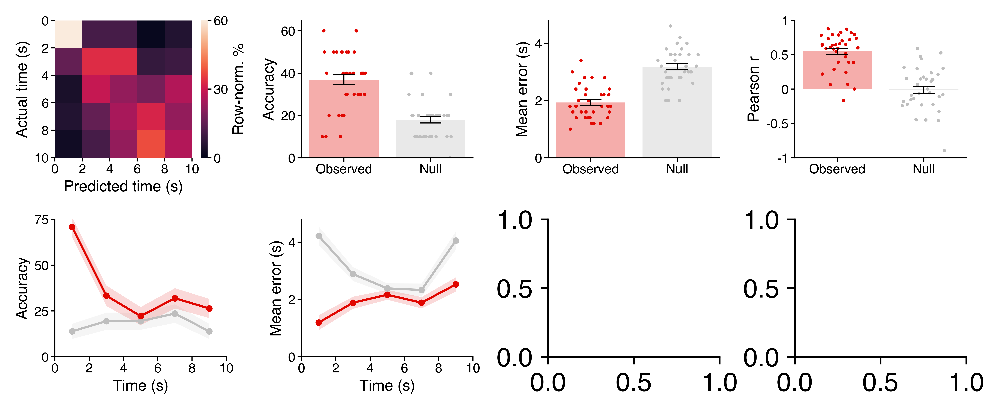

In [158]:
savefig = 0
overwrite = 1
verbose = 1
game_states = ['Delay1Delay2']
if time_steps_per_game_state[game_states[0]] == 5:
    ymin_acc = 0
    ymax_acc = 65
    yticks_acc = [0, 20, 40, 60]
    ymin_acc_time = 0
    ymax_acc_time = 75
    yticks_acc_time = [0, 25, 50, 75]
    yerr_mult = 2
    ymin_error_dist = 0
    ymax_error_dist = 4.8
    yticks_error_dist = [0, 2, 4]
    ymin_error_dist_time = 0
    ymax_error_dist_time = 4.8
    yticks_error_dist_time = [0, 2, 4]
    ymin_corr = -1
    ymax_corr = 1
    yticks_corr = [-1, -0.5, 0, 0.5, 1]
    vmin = 0
    vmax = 60
    cbar_ticks = [0, 30, 60]
elif time_steps_per_game_state[game_states[0]] == 10:
    ymin_acc = 0
    ymax_acc = 36
    yticks_acc = [0, 12, 24, 36]
    ymin_acc_time = 0
    ymax_acc_time = 75
    yticks_acc_time = [0, 25, 50, 75]
    yerr_mult = 1
    ymin_error_dist = 0
    ymax_error_dist = 4.6
    yticks_error_dist = [0, 1.5, 3, 4.5]
    ymin_error_dist_time = 0
    ymax_error_dist_time = 5.5
    yticks_error_dist_time = [0, 1.5, 3, 4.5]
    ymin_corr = -0.4
    ymax_corr = 0.8
    yticks_corr = [-0.4, 0, 0.4, 0.8]
    vmin = 0
    vmax = 40
    cbar_ticks = [0, 20, 40]

figsize = (colws[2]*2, colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
add_cbar = True
plot_decode = True
plot_xdecode = False
plot_null = True
alpha = 0.15 #0.3
linewidth = 1 # 0.6
fliersize = 2.5

# -----------------------------------------
plt.close()
fig, ax = plt.subplots(2, 4, dpi=dpi, figsize=figsize)
ax = np.ravel(ax)

for iState, game_state in enumerate(game_states):
    clf_dat = clf_results.query("(gameState=='{}')".format(game_state))
    n_test = 1 # len(clf_dat.iloc[0]['test_trials'])
    n_time_steps = clf_dat.iloc[0]['n_time_steps']
    reshp = [n_test, n_time_steps]
    if game_state[:5] == 'Delay':
        xticks = np.linspace(0, n_time_steps, num=6)
        xticklabels = [0, 2, 4, 6, 8, 10]
    else:
        xticks = np.linspace(0, n_time_steps, num=4)
        xticklabels = [0, 10, 20, 30]
    
    # Run stats.
    _mean, _sem = clf_dat['mean_acc'].mean(), stats.sem(clf_dat['mean_acc'])
    _mean_null, _sem_null = clf_dat['mean_acc_null'].mean(), stats.sem(clf_dat['mean_acc_null'])
    print('{}\n{}'.format(game_state, '-' * len(game_state)),
          'Accuracy',
          'within-decoding: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean * 100, _sem, clf_dat['mean_acc'].max()),
          'within null: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean_null * 100, _sem_null, clf_dat['mean_acc_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_acc'], clf_dat['mean_acc_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
    
    _mean, _sem = clf_dat['mean_abs_error_dist'].mean() * yerr_mult, stats.sem(clf_dat['mean_abs_error_dist']) * yerr_mult
    _mean_null, _sem_null = clf_dat['mean_abs_error_dist_null'].mean() * yerr_mult, stats.sem(clf_dat['mean_abs_error_dist_null']) * yerr_mult
    print('',
          'Error distance',
          'within-decoding: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean, _sem, clf_dat['mean_abs_error_dist'].max() * yerr_mult),
          'within null: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['mean_abs_error_dist_null'].max() * yerr_mult),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_abs_error_dist'], clf_dat['mean_abs_error_dist_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    _mean, _sem = clf_dat['pred_corr'].mean(), stats.sem(clf_dat['pred_corr'])
    _mean_null, _sem_null = clf_dat['pred_corr_null'].mean(), stats.sem(clf_dat['pred_corr_null'])
    print('',
          'Actual vs. predicted time correlation',
          'within-decoding: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean, _sem, clf_dat['pred_corr'].min(), clf_dat['pred_corr'].max()),
          'within null: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['pred_corr_null'].min(), clf_dat['pred_corr_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['pred_corr'], clf_dat['pred_corr_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
    
    # Accuracy by time.
    acc_by_time = np.array(clf_results.query("(gameState=='{}')".format(game_state))['acc_by_time'].tolist())
    acc_by_time = acc_by_time.reshape([np.prod(acc_by_time.shape[:-1]), acc_by_time.shape[-1]]) * 100
    mean_acc_by_time = np.mean(acc_by_time, axis=0)
    sem_acc_by_time = stats.sem(acc_by_time, axis=0)

    acc_by_time_null = np.array(clf_results.query("(gameState=='{}')".format(game_state))['acc_by_time_null'].tolist())
    acc_by_time_null = acc_by_time_null.reshape([np.prod(acc_by_time_null.shape[:-1]), acc_by_time_null.shape[-1]]) * 100
    mean_acc_by_time_null = np.mean(acc_by_time_null, axis=0)
    sem_acc_by_time_null = stats.sem(acc_by_time_null, axis=0)
    
    print('',
          'Accuracy by time',
          'within-decoding: {} ± {}'.format(mean_acc_by_time, sem_acc_by_time),
          'within null: {} ± {}'.format(mean_acc_by_time_null, sem_acc_by_time_null),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(acc_by_time, acc_by_time_null, axis=0))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests(np.concatenate([ttests[_test][1] for _test in ttests]), alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {}, P = {}, P_holm = {}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    # Absolute error distance by time.
    aed_by_time = np.array(clf_results.query("(gameState=='{}')".format(game_state))['abs_error_dist'].tolist())
    aed_by_time = aed_by_time.reshape([np.prod(aed_by_time.shape[:-1]), aed_by_time.shape[-1]]) * yerr_mult
    mean_aed_by_time = np.mean(aed_by_time, axis=0)
    sem_aed_by_time = stats.sem(aed_by_time, axis=0)

    aed_by_time_null = np.array(clf_results.query("(gameState=='{}')".format(game_state))['abs_error_dist_null'].tolist())
    aed_by_time_null = aed_by_time_null.reshape([np.prod(aed_by_time_null.shape[:-1]), aed_by_time_null.shape[-1]]) * yerr_mult
    mean_aed_by_time_null = np.mean(aed_by_time_null, axis=0)
    sem_aed_by_time_null = stats.sem(aed_by_time_null, axis=0)
    
    print('',
          'Absolute error by time',
          'within-decoding: {} ± {}'.format(mean_aed_by_time, sem_aed_by_time),
          'within null: {} ± {}'.format(mean_aed_by_time_null, sem_aed_by_time_null),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(aed_by_time, aed_by_time_null, axis=0))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests(np.concatenate([ttests[_test][1] for _test in ttests]), alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {}, P = {}, P_holm = {}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    print('')
    
    # Make plots.
    iax = (4 * iState) - 1
    
    # Within-state confusion matrix.
    if plot_decode:
        iax += 1
        cmat = np.mean(clf_dat.apply(lambda x: confusion_matrix(np.ravel(x['y_test']), np.ravel(x['y_test_pred']),
                                                                normalize='true'), axis=1).tolist(), axis=0) * 100
        print('cmat max: {:.3f}'.format(cmat.max()), end='\n\n')
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()
    
    # Cross-decoder confusion matrix.
    if plot_xdecode:
        iax += 1
        cmat = np.mean(xclf_dat.apply(lambda x: confusion_matrix(np.ravel(x['y_test']), np.ravel(x['y_test_pred']),
                                                                 normalize='true'), axis=1).tolist(), axis=0)
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()
    
    iax += 1
    # Mean accuracy.
    mean_acc = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_acc'].tolist())).T,
                                       np.vstack((['null'] * len(clf_dat), clf_dat['mean_acc_null'].tolist())).T)),
                            columns=['level', 'value'])
    mean_acc['level'] = mean_acc['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_acc['value'] = mean_acc['value'].astype(float)
    mean_acc['value'] *= 100
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_acc['level'].unique().size), mean_acc.groupby('level')['value'].mean().values,
                     yerr=mean_acc.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_acc, ymax_acc])
    ax[iax].set_yticks(yticks_acc)
    ax[iax].set_yticklabels(yticks_acc, fontsize=font['tick'])
    ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean absolute error.
    mean_errors = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_abs_error_dist'].tolist())).T,
                                          np.vstack((['null'] * len(clf_dat), clf_dat['mean_abs_error_dist_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_errors['level'] = mean_errors['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_errors['value'] = mean_errors['value'].astype(float) * yerr_mult
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_errors['level'].unique().size), mean_errors.groupby('level')['value'].mean().values,
                     yerr=mean_errors.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
    ax[iax].set_yticks(yticks_error_dist)
    ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
    ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Actual vs. predicted correlation.
    mean_corrs = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['pred_corr'].tolist())).T,
                                         np.vstack((['null'] * len(clf_dat), clf_dat['pred_corr_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_corrs['level'] = mean_corrs['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_corrs['value'] = mean_corrs['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_corrs['level'].unique().size), mean_corrs.groupby('level')['value'].mean().values,
                     yerr=mean_corrs.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_corr, ymax_corr])
    ax[iax].set_yticks(yticks_corr)
    ax[iax].set_yticklabels(yticks_corr, fontsize=font['tick'])
    ax[iax].set_ylabel('Pearson r', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Accuracy by time.
    if plot_decode:
        xvals = np.arange(len(mean_acc_by_time))
        ax[iax].fill_between(xvals, mean_acc_by_time + sem_acc_by_time, mean_acc_by_time - sem_acc_by_time,
                             color='#e10600', linewidth=0, alpha=alpha, zorder=2)
        ax[iax].plot(xvals, mean_acc_by_time, color='#e10600', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=5)
    if plot_xdecode:
        xvals = np.arange(len(mean_xacc_by_time))
        ax[iax].fill_between(xvals, mean_xacc_by_time + sem_xacc_by_time, mean_xacc_by_time - sem_xacc_by_time,
                             color='#296eb4', linewidth=0, alpha=alpha, zorder=1)
        ax[iax].plot(xvals, mean_xacc_by_time, color='#296eb4', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=4)
    if plot_null:
        xvals = np.arange(len(mean_acc_by_time))
        ax[iax].fill_between(xvals, mean_acc_by_time_null + sem_acc_by_time_null, mean_acc_by_time_null - sem_acc_by_time_null,
                             color='#bebebe', linewidth=0, alpha=alpha, zorder=0)
        ax[iax].plot(xvals, mean_acc_by_time_null, color='#bebebe', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=3)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    _xticks = xticks - 0.5
    ax[iax].set_xlim([-0.5, xvals.size-0.5])
    ax[iax].set_xticks(_xticks)
    ax[iax].set_xticklabels(xticklabels)
    ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
    ax[iax].set_ylim([ymin_acc_time, ymax_acc_time])
    ax[iax].set_yticks(yticks_acc_time)
    ax[iax].set_yticklabels(yticks_acc_time, fontsize=font['tick'])
    ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Error distance.
    if plot_decode:
        xvals = np.arange(len(mean_aed_by_time))
        ax[iax].fill_between(xvals, mean_aed_by_time + sem_aed_by_time, mean_aed_by_time - sem_aed_by_time,
                             color='#e10600', linewidth=0, alpha=alpha, zorder=2)
        ax[iax].plot(xvals, mean_aed_by_time, color='#e10600', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=5)
    if plot_xdecode:
        xvals = np.arange(len(mean_xaed_by_time))
        ax[iax].fill_between(xvals, mean_xaed_by_time + sem_xaed_by_time, mean_xaed_by_time - sem_xaed_by_time,
                             color='#296eb4', linewidth=0, alpha=alpha, zorder=1)
        ax[iax].plot(xvals, mean_xaed_by_time, color='#296eb4', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=4)
    if plot_null:
        xvals = np.arange(len(mean_aed_by_time))
        ax[iax].fill_between(xvals, mean_aed_by_time_null + sem_aed_by_time_null, mean_aed_by_time_null - sem_aed_by_time_null,
                             color='#bebebe', linewidth=0, alpha=alpha, zorder=0)
        ax[iax].plot(xvals, mean_aed_by_time_null, color='#bebebe', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=3)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    _xticks = xticks - 0.5
    ax[iax].set_xlim([-0.5, xvals.size-0.5])
    ax[iax].set_xticks(_xticks)
    ax[iax].set_xticklabels(xticklabels)
    ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
    ax[iax].set_ylim([ymin_error_dist_time, ymax_error_dist_time])
    ax[iax].set_yticks(yticks_error_dist_time)
    ax[iax].set_yticklabels(yticks_error_dist_time, fontsize=font['tick'])
    ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
        
fig.tight_layout(pad=0.25, h_pad=1)

if savefig:
    filename = op.join(proj_dir, 'figs', 'classifiers', 
                       'SVC_predicting_time_step-{}units-random_search-36fold-{}_{}bins.pdf'
                       .format(n_units, game_state, n_time_steps))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight')
        if verbose:
            print('Saved {}'.format(filename))
        
fig.show()

EncodingRetrieval
-----------------
Accuracy
within-decoding: 28.0 ± 1.2%, max = 0.467
within null: 6.0 ± 0.5%, max = 0.133
within_vs_null: T(35) = 15.6, P = 0.000000, P_holm = 0.000000, reject = True

Error distance
within-decoding: 3.8 ± 0.1, max = 6.000
within null: 10.4 ± 0.2, max = 12.867
within_vs_null: T(35) = -26.3, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
within-decoding: 0.788 ± 0.014, min = 0.588, max = 0.924
within null: -0.043 ± 0.029, min = -0.357, max = 0.363
within_vs_null: T(35) = 25.0, P = 0.000000, P_holm = 0.000000, reject = True

Accuracy by time
within-decoding: [93.05555556 52.77777778 31.94444444 31.94444444 36.11111111 20.83333333
 20.83333333 26.38888889  9.72222222 19.44444444  2.77777778  9.72222222
 18.05555556 19.44444444 26.38888889] ± [3.01689873 5.92474395 5.53350475 5.53350475 5.70038146 4.81971531
 4.81971531 5.23061873 3.51596083 4.6969544  1.95030416 3.51596083
 4.56494985 4.6969544  5.23061873]
within nu

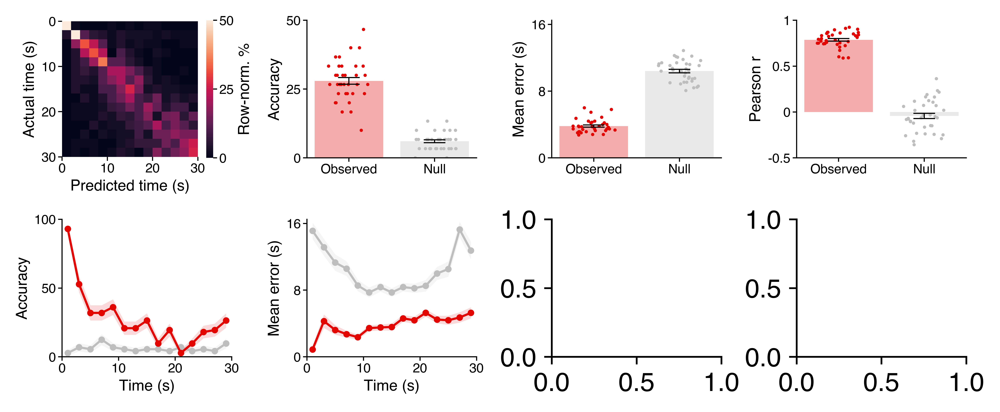

In [167]:
savefig = 1
overwrite = 1
verbose = 1
game_states = ['EncodingRetrieval']
if time_steps_per_game_state[game_states[0]] == 15:
    ymin_acc = 0
    ymax_acc = 50
    yticks_acc = [0, 25, 50]
    ymin_acc_time = 0
    ymax_acc_time = 100
    yticks_acc_time = [0, 50, 100]
    yerr_mult = 2
    ymin_error_dist = 0
    ymax_error_dist = 16.5
    yticks_error_dist = [0, 8, 16]
    ymin_error_dist_time = 0
    ymax_error_dist_time = 16.5
    yticks_error_dist_time = [0, 8, 16]
    ymin_corr = -0.5
    ymax_corr = 1
    yticks_corr = [-0.5, 0, 0.5, 1]
    vmin = 0
    vmax = 50
    cbar_ticks = [0, 25, 50]
elif time_steps_per_game_state[game_states[0]] == 30:
    ymin_acc = 0
    ymax_acc = 30
    yticks_acc = [0, 10, 20, 30]
    ymin_acc_time = 0
    ymax_acc_time = 100
    yticks_acc_time = [0, 25, 50, 75, 100]
    yerr_mult = 1
    ymin_error_dist = 0
    ymax_error_dist = 15
    yticks_error_dist = [0, 5, 10, 15]
    ymin_error_dist_time = 0
    ymax_error_dist_time = 15
    yticks_error_dist_time = [0, 5, 10, 15]
    ymin_corr = -0.25
    ymax_corr = 1
    yticks_corr = [0, 0.5, 1]
    vmin = 0
    vmax = 30
    cbar_ticks = [0, 10, 20, 30]

figsize = (colws[2]*2, colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
add_cbar = True
plot_decode = True
plot_xdecode = False
plot_null = True
alpha = 0.15 #0.3
linewidth = 1 # 0.6
fliersize = 2.5

# -----------------------------------------
plt.close()
fig, ax = plt.subplots(2, 4, dpi=dpi, figsize=figsize)
ax = np.ravel(ax)

for iState, game_state in enumerate(game_states):
    clf_dat = clf_results.query("(gameState=='{}')".format(game_state))
    n_test = 1 # len(clf_dat.iloc[0]['test_trials'])
    n_time_steps = clf_dat.iloc[0]['n_time_steps']
    reshp = [n_test, n_time_steps]
    if game_state[:5] == 'Delay':
        xticks = np.linspace(0, n_time_steps, num=6)
        xticklabels = [0, 2, 4, 6, 8, 10]
    else:
        xticks = np.linspace(0, n_time_steps, num=4)
        xticklabels = [0, 10, 20, 30]
    
    # Run stats.
    _mean, _sem = clf_dat['mean_acc'].mean(), stats.sem(clf_dat['mean_acc'])
    _mean_null, _sem_null = clf_dat['mean_acc_null'].mean(), stats.sem(clf_dat['mean_acc_null'])
    print('{}\n{}'.format(game_state, '-' * len(game_state)),
          'Accuracy',
          'within-decoding: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean * 100, _sem, clf_dat['mean_acc'].max()),
          'within null: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean_null * 100, _sem_null, clf_dat['mean_acc_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_acc'], clf_dat['mean_acc_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
    
    _mean, _sem = clf_dat['mean_abs_error_dist'].mean() * yerr_mult, stats.sem(clf_dat['mean_abs_error_dist']) * yerr_mult
    _mean_null, _sem_null = clf_dat['mean_abs_error_dist_null'].mean() * yerr_mult, stats.sem(clf_dat['mean_abs_error_dist_null']) * yerr_mult
    print('',
          'Error distance',
          'within-decoding: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean, _sem, clf_dat['mean_abs_error_dist'].max() * yerr_mult),
          'within null: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['mean_abs_error_dist_null'].max() * yerr_mult),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_abs_error_dist'], clf_dat['mean_abs_error_dist_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    _mean, _sem = clf_dat['pred_corr'].mean(), stats.sem(clf_dat['pred_corr'])
    _mean_null, _sem_null = clf_dat['pred_corr_null'].mean(), stats.sem(clf_dat['pred_corr_null'])
    print('',
          'Actual vs. predicted time correlation',
          'within-decoding: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean, _sem, clf_dat['pred_corr'].min(), clf_dat['pred_corr'].max()),
          'within null: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['pred_corr_null'].min(), clf_dat['pred_corr_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['pred_corr'], clf_dat['pred_corr_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
    
    # Accuracy by time.
    acc_by_time = np.array(clf_results.query("(gameState=='{}')".format(game_state))['acc_by_time'].tolist())
    acc_by_time = acc_by_time.reshape([np.prod(acc_by_time.shape[:-1]), acc_by_time.shape[-1]]) * 100
    mean_acc_by_time = np.mean(acc_by_time, axis=0)
    sem_acc_by_time = stats.sem(acc_by_time, axis=0)

    acc_by_time_null = np.array(clf_results.query("(gameState=='{}')".format(game_state))['acc_by_time_null'].tolist())
    acc_by_time_null = acc_by_time_null.reshape([np.prod(acc_by_time_null.shape[:-1]), acc_by_time_null.shape[-1]]) * 100
    mean_acc_by_time_null = np.mean(acc_by_time_null, axis=0)
    sem_acc_by_time_null = stats.sem(acc_by_time_null, axis=0)
    
    print('',
          'Accuracy by time',
          'within-decoding: {} ± {}'.format(mean_acc_by_time, sem_acc_by_time),
          'within null: {} ± {}'.format(mean_acc_by_time_null, sem_acc_by_time_null),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(acc_by_time, acc_by_time_null, axis=0))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests(np.concatenate([ttests[_test][1] for _test in ttests]), alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {}, P = {}, P_holm = {}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    # Absolute error distance by time.
    aed_by_time = np.array(clf_results.query("(gameState=='{}')".format(game_state))['abs_error_dist'].tolist())
    aed_by_time = aed_by_time.reshape([np.prod(aed_by_time.shape[:-1]), aed_by_time.shape[-1]]) * yerr_mult
    mean_aed_by_time = np.mean(aed_by_time, axis=0)
    sem_aed_by_time = stats.sem(aed_by_time, axis=0)

    aed_by_time_null = np.array(clf_results.query("(gameState=='{}')".format(game_state))['abs_error_dist_null'].tolist())
    aed_by_time_null = aed_by_time_null.reshape([np.prod(aed_by_time_null.shape[:-1]), aed_by_time_null.shape[-1]]) * yerr_mult
    mean_aed_by_time_null = np.mean(aed_by_time_null, axis=0)
    sem_aed_by_time_null = stats.sem(aed_by_time_null, axis=0)
    
    print('',
          'Absolute error by time',
          'within-decoding: {} ± {}'.format(mean_aed_by_time, sem_aed_by_time),
          'within null: {} ± {}'.format(mean_aed_by_time_null, sem_aed_by_time_null),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(aed_by_time, aed_by_time_null, axis=0))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests(np.concatenate([ttests[_test][1] for _test in ttests]), alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {}, P = {}, P_holm = {}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    print('')
    
    # Make plots.
    iax = (4 * iState) - 1
    
    # Within-state confusion matrix.
    if plot_decode:
        iax += 1
        cmat = np.mean(clf_dat.apply(lambda x: confusion_matrix(np.ravel(x['y_test']), np.ravel(x['y_test_pred']),
                                                                normalize='true'), axis=1).tolist(), axis=0) * 100
        print('cmat max: {:.3f}'.format(cmat.max()), end='\n\n')
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()
    
    # Cross-decoder confusion matrix.
    if plot_xdecode:
        iax += 1
        cmat = np.mean(xclf_dat.apply(lambda x: confusion_matrix(np.ravel(x['y_test']), np.ravel(x['y_test_pred']),
                                                                 normalize='true'), axis=1).tolist(), axis=0)
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()
    
    iax += 1
    # Mean accuracy.
    mean_acc = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_acc'].tolist())).T,
                                       np.vstack((['null'] * len(clf_dat), clf_dat['mean_acc_null'].tolist())).T)),
                            columns=['level', 'value'])
    mean_acc['level'] = mean_acc['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_acc['value'] = mean_acc['value'].astype(float)
    mean_acc['value'] *= 100
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_acc['level'].unique().size), mean_acc.groupby('level')['value'].mean().values,
                     yerr=mean_acc.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_acc, ymax_acc])
    ax[iax].set_yticks(yticks_acc)
    ax[iax].set_yticklabels(yticks_acc, fontsize=font['tick'])
    ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean absolute error.
    mean_errors = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_abs_error_dist'].tolist())).T,
                                          np.vstack((['null'] * len(clf_dat), clf_dat['mean_abs_error_dist_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_errors['level'] = mean_errors['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_errors['value'] = mean_errors['value'].astype(float) * yerr_mult
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_errors['level'].unique().size), mean_errors.groupby('level')['value'].mean().values,
                     yerr=mean_errors.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
    ax[iax].set_yticks(yticks_error_dist)
    ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
    ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Actual vs. predicted correlation.
    mean_corrs = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['pred_corr'].tolist())).T,
                                         np.vstack((['null'] * len(clf_dat), clf_dat['pred_corr_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_corrs['level'] = mean_corrs['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_corrs['value'] = mean_corrs['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_corrs['level'].unique().size), mean_corrs.groupby('level')['value'].mean().values,
                     yerr=mean_corrs.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_corr, ymax_corr])
    ax[iax].set_yticks(yticks_corr)
    ax[iax].set_yticklabels(yticks_corr, fontsize=font['tick'])
    ax[iax].set_ylabel('Pearson r', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Accuracy by time.
    if plot_decode:
        xvals = np.arange(len(mean_acc_by_time))
        ax[iax].fill_between(xvals, mean_acc_by_time + sem_acc_by_time, mean_acc_by_time - sem_acc_by_time,
                             color='#e10600', linewidth=0, alpha=alpha, zorder=2)
        ax[iax].plot(xvals, mean_acc_by_time, color='#e10600', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=5)
    if plot_xdecode:
        xvals = np.arange(len(mean_xacc_by_time))
        ax[iax].fill_between(xvals, mean_xacc_by_time + sem_xacc_by_time, mean_xacc_by_time - sem_xacc_by_time,
                             color='#296eb4', linewidth=0, alpha=alpha, zorder=1)
        ax[iax].plot(xvals, mean_xacc_by_time, color='#296eb4', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=4)
    if plot_null:
        xvals = np.arange(len(mean_acc_by_time))
        ax[iax].fill_between(xvals, mean_acc_by_time_null + sem_acc_by_time_null, mean_acc_by_time_null - sem_acc_by_time_null,
                             color='#bebebe', linewidth=0, alpha=alpha, zorder=0)
        ax[iax].plot(xvals, mean_acc_by_time_null, color='#bebebe', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=3)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    _xticks = xticks - 0.5
    ax[iax].set_xlim([-0.5, xvals.size-0.5])
    ax[iax].set_xticks(_xticks)
    ax[iax].set_xticklabels(xticklabels)
    ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
    ax[iax].set_ylim([ymin_acc_time, ymax_acc_time])
    ax[iax].set_yticks(yticks_acc_time)
    ax[iax].set_yticklabels(yticks_acc_time, fontsize=font['tick'])
    ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Error distance.
    if plot_decode:
        xvals = np.arange(len(mean_aed_by_time))
        ax[iax].fill_between(xvals, mean_aed_by_time + sem_aed_by_time, mean_aed_by_time - sem_aed_by_time,
                             color='#e10600', linewidth=0, alpha=alpha, zorder=2)
        ax[iax].plot(xvals, mean_aed_by_time, color='#e10600', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=5)
    if plot_xdecode:
        xvals = np.arange(len(mean_xaed_by_time))
        ax[iax].fill_between(xvals, mean_xaed_by_time + sem_xaed_by_time, mean_xaed_by_time - sem_xaed_by_time,
                             color='#296eb4', linewidth=0, alpha=alpha, zorder=1)
        ax[iax].plot(xvals, mean_xaed_by_time, color='#296eb4', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=4)
    if plot_null:
        xvals = np.arange(len(mean_aed_by_time))
        ax[iax].fill_between(xvals, mean_aed_by_time_null + sem_aed_by_time_null, mean_aed_by_time_null - sem_aed_by_time_null,
                             color='#bebebe', linewidth=0, alpha=alpha, zorder=0)
        ax[iax].plot(xvals, mean_aed_by_time_null, color='#bebebe', linewidth=linewidth,
                     linestyle='-', marker='o', markersize=font['annot']/3, zorder=3)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    _xticks = xticks - 0.5
    ax[iax].set_xlim([-0.5, xvals.size-0.5])
    ax[iax].set_xticks(_xticks)
    ax[iax].set_xticklabels(xticklabels)
    ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
    ax[iax].set_ylim([ymin_error_dist_time, ymax_error_dist_time])
    ax[iax].set_yticks(yticks_error_dist_time)
    ax[iax].set_yticklabels(yticks_error_dist_time, fontsize=font['tick'])
    ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
        
fig.tight_layout(pad=0.25, h_pad=1)

if savefig:
    filename = op.join(proj_dir, 'figs', 'classifiers', 
                       'SVC_predicting_time_step-{}units-random_search-36fold-{}_{}bins.pdf'
                       .format(n_units, game_state, n_time_steps))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight')
        if verbose:
            print('Saved {}'.format(filename))
        
fig.show()

# Time cell time classifiers for each trial interval, separately

In [ ]:
# Train classifiers to predict time in each game state,
# using all neurons and saving the output classifiers.
game_states = ['Delay1', 'Delay2', 'Encoding', 'Retrieval']
time_steps_per_game_state={'Delay1': 10, 'Encoding': 30, 'Delay2': 10, 'Retrieval': 30}
drop_first2 = False
save_results = True
overwrite = True
verbose = True

start_time = time()

clf_results = pop_decoding.classify_time(game_states=game_states,
                                         time_steps_per_game_state=time_steps_per_game_state,
                                         drop_first2=drop_first2,
                                         save_clfs=True,
                                         proj_dir=proj_dir,
                                         save_results=save_results,
                                         overwrite=overwrite,
                                         verbose=verbose)

print('Done in {:.1f} min'.format((time() - start_time) / 60))

Delay1: Fitting 476 neurons from all, 0.3 min
Delay2: Fitting 476 neurons from all, 36.7 min
Encoding: Fitting 476 neurons from all, 75.4 min


In [28]:
# Train classifiers to predict time in each game state,
# using only significant time cells for that game state.
game_states = ['Delay1', 'Delay2', 'Encoding', 'Retrieval']
time_steps_per_game_state={'Delay1': 10, 'Encoding': 30, 'Delay2': 10, 'Retrieval': 30}
save_results = True
overwrite = 0
verbose = True

start_time = time()

qry = "(gameState=='{}') & (testvar=='time') & (sig==True) & (beta_abs_max>0)"
unit_groups = od({game_state: ols_pairs.query(qry.format(game_state))['subj_sess_unit'].unique()
                  for game_state in game_states})

for game_state in game_states:
    _unit_groups = {game_state: unit_groups[game_state]}
    clf_results = pop_decoding.classify_time(unit_groups=_unit_groups,
                                             game_states=[game_state],
                                             time_steps_per_game_state=time_steps_per_game_state,
                                             proj_dir=proj_dir,
                                             save_results=save_results,
                                             overwrite=overwrite,
                                             verbose=verbose)

print('Done in {:.1f}s'.format(time() - start_time))

Delay2, Delay2, loop 0, fitting 46 neurons: 0.0 min
Saved /home1/dscho/projects/time_cells/analysis/classifiers/SVC_predicting_time_step-46units_Delay2-random_search-36fold-Delay2_10bins.pkl
Done in 10.9 min
Encoding, Encoding, loop 0, fitting 52 neurons: 0.0 min
Saved /home1/dscho/projects/time_cells/analysis/classifiers/SVC_predicting_time_step-52units_Encoding-random_search-36fold-Encoding_30bins.pkl
Done in 39.4 min
Retrieval, Retrieval, loop 0, fitting 44 neurons: 0.0 min
Saved /home1/dscho/projects/time_cells/analysis/classifiers/SVC_predicting_time_step-44units_Retrieval-random_search-36fold-Retrieval_30bins.pkl
Done in 41.6 min
Done in 5520.5s


In [83]:
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
n_units = {'Delay1': 58,
           'Encoding': 52,
           'Delay2': 46,
           'Retrieval': 44}
time_steps_per_game_state = {'Delay1': 10,
                             'Encoding': 30,
                             'Delay2': 10,
                             'Retrieval': 30}

filenames = [op.join(proj_dir, 'analysis', 'classifiers', 
                     'SVC_predicting_time_step-{}units_{}-random_search-36fold-{}_{}bins.pkl'
                     .format(n_units[game_state], game_state, game_state, time_steps_per_game_state[game_state]))
             for game_state in game_states]

clf_results = pd.concat([dio.open_pickle(filename) for filename in filenames])

# --------------------------
# Resort y_test_null and y_test_pred_null on the values within each y_test_null test trial.
def sort_onto(sort_on, 
              apply_to, 
              n_split=1):
    """Sort the values within each split of sort_on.
    
    Apply the sorting indices to apply_to."""
    # Split the input vectors.
    sort_on = np.split(np.array(sort_on), n_split)
    apply_to = np.split(np.array(apply_to), n_split)
    
    v_out = []
    for iSplit in range(len(sort_on)):
        v_out += list(apply_to[iSplit][np.argsort(sort_on[iSplit])])
    
    return v_out

for _df in (clf_results,):
    for col in ['y_test_pred_null', 'y_test_null']:
        _df[col] = _df.apply(lambda x: sort_onto(x['y_test_null'], x[col], len(x['test_trials'])), axis=1)

# --------------------------
# Add error distances between actual and predicted values.
def clf_error_dist(y_test, y_test_pred):
    """Return the difference between predicted and actual values."""
    return list(np.array(y_test_pred) - np.array(y_test))

for _df in (clf_results,):
    if 'error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy')+1,
                   'error_dist',
                   _df.apply(lambda x: clf_error_dist(x['y_test'], x['y_test_pred']), axis=1))
    if 'error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy_null')+1,
                   'error_dist_null',
                   _df.apply(lambda x: clf_error_dist(x['y_test_null'], x['y_test_pred_null']), axis=1))
    if 'mean_abs_error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist')+1,
                   'mean_abs_error_dist',
                   _df['error_dist'].apply(lambda x: np.mean(np.abs(x))).tolist())
    if 'mean_abs_error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist_null')+1,
                   'mean_abs_error_dist_null',
                   _df['error_dist_null'].apply(lambda x: np.mean(np.abs(x))).tolist())
        
null_error_dists = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: np.abs(x.tolist())) # game_state: trial x time
null_error_time = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=0), stats.sem(np.abs(x.tolist()), axis=0)]) # game_state: time
null_error_trial = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=1), stats.sem(np.abs(x.tolist()), axis=1)]) # game_state: trial

# Convert test_trials from list to int for LOO-CV where only one trial is tested at a time.
clf_results['test_trials'] = clf_results['test_trials'].apply(lambda x: int(x[0]))

# Add correlations between actual and predicted times, by trial.
clf_results['pred_corr'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred'], x['y_test'])[0], axis=1).fillna(0)
clf_results['pred_corr_null'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred_null'], x['y_test_null'])[0], axis=1).fillna(0)

print(clf_results.shape)

(144, 27)


/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1377: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/matplotlib/axes/_base.py:239: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


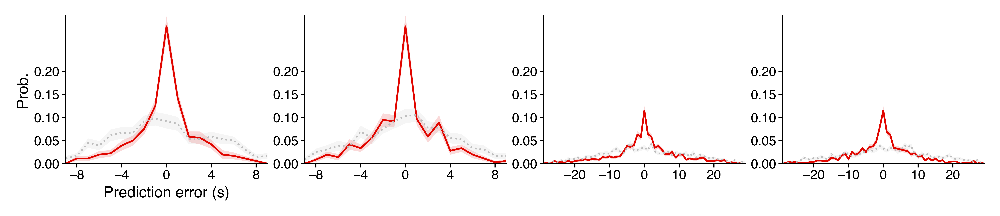

In [44]:
# Get lag-CRP style curves for classifier performance vs. actual time.
savefig = 0
overwrite = 0
figsize = (colws[2]*2, colws[2]*0.4)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
colors = ['#e10600', '#bebebe']
linestyles = ['-', 'dotted']
linewidth = 0.8
alpha = 0.15
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
xlim = {'Delay1': [-9, 9],
        'Encoding': [-29, 29],
        'Delay2': [-9, 9],
        'Retrieval': [-29, 29]}
xticks = {'Delay1': [-8, -4, 0, 4, 8],
          'Encoding': [-20, -10, 0, 10, 20],
          'Delay2': [-8, -4, 0, 4, 8],
          'Retrieval': [-20, -10, 0, 10, 20]}
ymin = 0
ymax = 0.32
yticks = [0, 0.05, 0.1, 0.15, 0.2]
game_states = ['Delay1', 'Delay2', 'Encoding', 'Retrieval']

def _count_error_dists(game_state, err_dists):
    if 'Delay' in game_state:
        err_props = pd.Series(data=np.zeros(19, dtype=int), index=np.arange(-9, 10))
    else:
        err_props = pd.Series(data=np.zeros(59, dtype=int), index=np.arange(-29, 30))
    
    counts = aop.unique(err_dists)
    for err_dist in err_props.index:
        err_props[err_dist] = counts.get(err_dist, 0)
    
    return err_props

# --------------------------------------
# Observed-decoding
err_counts = od({game_state: clf_results.query("(gameState=='{}')".format(game_state)).apply(lambda x: _count_error_dists(x['gameState'], x['error_dist']), axis=1)
                 for game_state in game_states})
err_props = od([])
for game_state in err_counts:
    if 'Delay' in game_state:
        n_time_bins = 10
    else:
        n_time_bins = 30
    _err_props = err_counts[game_state]/n_time_bins # trial x err_dist
    err_props[game_state] = {'means': np.mean(_err_props, axis=0),
                             'sems': stats.sem(_err_props, axis=0)}
    
# --------------------------------------
# Null
err_counts_null = od({game_state: clf_results.query("(gameState=='{}')".format(game_state)).apply(lambda x: _count_error_dists(x['gameState'], x['error_dist_null']), axis=1)
                      for game_state in game_states})
err_props_null = od([])
for game_state in err_counts_null:
    if 'Delay' in game_state:
        n_time_bins = 10
    else:
        n_time_bins = 30
    _err_props = err_counts_null[game_state]/n_time_bins # trial x err_dist
    err_props_null[game_state] = {'means': np.mean(_err_props, axis=0),
                                  'sems': stats.sem(_err_props, axis=0)}
    
# --------------------------------------
err_props_all = od([('matched', err_props),
                    ('null', err_props_null)])

# Make plots.
plt.close()
fig, ax = plt.subplots(1, 4, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

for iax, game_state in enumerate(game_states):
    xvals = err_props[game_state]['means'].index.tolist()
    for iColor, clf_type in enumerate(err_props_all.keys()):
        ax[iax].fill_between(xvals, 
                             err_props_all[clf_type][game_state]['means'] + err_props_all[clf_type][game_state]['sems'],
                             err_props_all[clf_type][game_state]['means'] - err_props_all[clf_type][game_state]['sems'],
                             color=colors[iColor], linewidth=0, alpha=alpha, zorder=0)
        ax[iax].plot(xvals, err_props_all[clf_type][game_state]['means'],
                     color=colors[iColor], linewidth=linewidth, linestyle=linestyles[iColor], zorder=1)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xlim(xlim[game_state])
    ax[iax].set_xticks(xticks[game_state])
    ax[iax].set_ylim([ymin, ymax])
    ax[iax].set_yticks(yticks)
    if iax == 0:
        ax[iax].set_xlabel('Prediction error (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Prob.', fontsize=font['label'], labelpad=labelpad)

fig.tight_layout(pad=0.25, h_pad=1.05)

if savefig:
    filename = op.join(proj_dir, 'figs', 'classifiers', 
                       'SVC_predicting_time_step-{}units-random_search-36fold-{}_{}bins-{}_{}bins___.pdf'
                       .format(n_units, game_states[0], n_time_steps, game_states[1], n_time_steps))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight')
        
fig.show()

In [129]:
for game_state in ['Delay1', 'Delay2', 'Encoding', 'Retrieval']:
    print('{}: {}'.format(game_state,
                          np.percentile(np.mean(clf_results
                                                .query("(gameState=='{}')".format(game_state))
                                                .apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(),
                                                axis=0),
                                        99.8)))

Delay1: 0.622666666666668
Delay2: 0.6675000000000028
Encoding: 0.27272222222222176
Retrieval: 0.28338888888888886


Delay1
------
Accuracy
within-decoding: 29.7 ± 2.2%, max = 0.600
within null: 9.2 ± 1.6%, max = 0.400
within_vs_null: T(35) = 7.2, P = 0.000000, P_holm = 0.000000, reject = True

Error distance
within-decoding: 1.9 ± 0.1, max = 3.700
within null: 3.5 ± 0.1, max = 5.700
within_vs_null: T(35) = -8.5, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
within-decoding: 0.587 ± 0.042, min = 0.025, max = 0.934
within null: -0.041 ± 0.046, min = -0.556, max = 0.441
within_vs_null: T(35) = 9.5, P = 0.000000, P_holm = 0.000000, reject = True

cmat max: 66.667

Delay2
------
Accuracy
within-decoding: 29.7 ± 2.6%, max = 0.700
within null: 10.3 ± 1.6%, max = 0.300
within_vs_null: T(35) = 6.0, P = 0.000001, P_holm = 0.000001, reject = True

Error distance
within-decoding: 2.1 ± 0.1, max = 3.300
within null: 3.3 ± 0.1, max = 4.500
within_vs_null: T(35) = -7.2, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
within-decoding: 0.4

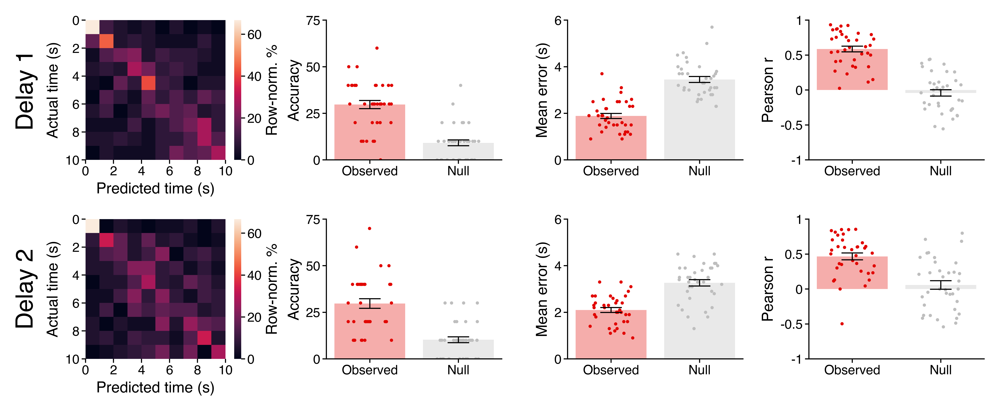

In [137]:
savefig = 0
overwrite = 0
game_states = ['Delay1', 'Delay2']
figsize = (colws[2]*2, colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ymin_acc = 0
ymax_acc = 75
yticks_acc = [0, 25, 50, 75]
error_dist_mult = 1 # 2
ymin_error_dist = 0
ymax_error_dist = 6
yticks_error_dist = [0, 2, 4, 6]
ymin_corr = -1
ymax_corr = 1
yticks_corr = [-1, -0.5, 0, 0.5, 1]
vmin = 0
vmax = 66.7
cbar_ticks = [0, 20, 40, 60]
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
add_cbar = True
plot_decode = True
plot_xdecode = False
plot_null = True
alpha = 0.15 #0.3
linewidth = 1 # 0.6
fliersize = 2.5

# -----------------------------------------
plt.close()
fig, ax = plt.subplots(2, 4, dpi=dpi, figsize=figsize)
ax = np.ravel(ax)

for iState, game_state in enumerate(game_states):
    clf_dat = clf_results.query("(gameState=='{}')".format(game_state))
    n_test = 1 # len(clf_dat.iloc[0]['test_trials'])
    n_time_steps = clf_dat.iloc[0]['n_time_steps']
    reshp = [n_test, n_time_steps]
    if game_state[:5] == 'Delay':
        xticks = np.linspace(0, n_time_steps, num=6)
        xticklabels = [0, 2, 4, 6, 8, 10]
    else:
        xticks = np.linspace(0, n_time_steps, num=4)
        xticklabels = [0, 10, 20, 30]
    
    # Run stats.
    _mean, _sem = clf_dat['mean_acc'].mean(), stats.sem(clf_dat['mean_acc'])
    _mean_null, _sem_null = clf_dat['mean_acc_null'].mean(), stats.sem(clf_dat['mean_acc_null'])
    print('{}\n{}'.format(game_state, '-' * len(game_state)),
          'Accuracy',
          'within-decoding: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean * 100, _sem, clf_dat['mean_acc'].max()),
          'within null: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean_null * 100, _sem_null, clf_dat['mean_acc_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_acc'], clf_dat['mean_acc_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
    
    _mean, _sem = clf_dat['mean_abs_error_dist'].mean(), stats.sem(clf_dat['mean_abs_error_dist'])
    _mean_null, _sem_null = clf_dat['mean_abs_error_dist_null'].mean(), stats.sem(clf_dat['mean_abs_error_dist_null'])
    print('',
          'Error distance',
          'within-decoding: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean, _sem, clf_dat['mean_abs_error_dist'].max()),
          'within null: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['mean_abs_error_dist_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_abs_error_dist'], clf_dat['mean_abs_error_dist_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    _mean, _sem = clf_dat['pred_corr'].mean(), stats.sem(clf_dat['pred_corr'])
    _mean_null, _sem_null = clf_dat['pred_corr_null'].mean(), stats.sem(clf_dat['pred_corr_null'])
    print('',
          'Actual vs. predicted time correlation',
          'within-decoding: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean, _sem, clf_dat['pred_corr'].min(), clf_dat['pred_corr'].max()),
          'within null: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['pred_corr_null'].min(), clf_dat['pred_corr_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['pred_corr'], clf_dat['pred_corr_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    print('')
    
    # Make plots.
    iax = (4 * iState) - 1
    
    # Within-state confusion matrix.
    if plot_decode:
        iax += 1
        cmat = np.mean(clf_dat.apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(), axis=0) * 100
        print('cmat max: {:.3f}'.format(cmat.max()), end='\n\n')
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()

        ax[iax].text(x=ax[iax].get_xlim()[0] - (np.diff(ax[iax].get_xlim()) * 0.5), # 0.4
                     y=np.mean(ax[iax].get_ylim()),
                     s=game_state.replace('Delay', 'Delay '),
                     fontsize=font['fig'], rotation=90, va='center')
    
    # Cross-decoder confusion matrix.
    if plot_xdecode:
        iax += 1
        cmat = np.mean(xclf_dat.apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(), axis=0)
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()
    
    iax += 1
    # Mean accuracy across time bins.
    mean_acc = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_acc'].tolist())).T,
                                       np.vstack((['null'] * len(clf_dat), clf_dat['mean_acc_null'].tolist())).T)),
                            columns=['level', 'value'])
    mean_acc['level'] = mean_acc['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_acc['value'] = mean_acc['value'].astype(float)
    mean_acc['value'] *= 100
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_acc['level'].unique().size), mean_acc.groupby('level')['value'].mean().values,
                     yerr=mean_acc.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_acc, ymax_acc])
    ax[iax].set_yticks(yticks_acc)
    ax[iax].set_yticklabels(yticks_acc, fontsize=font['tick'])
    ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean error across time bins.
    mean_errors = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_abs_error_dist'].tolist())).T,
                                          np.vstack((['null'] * len(clf_dat), clf_dat['mean_abs_error_dist_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_errors['level'] = mean_errors['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_errors['value'] = mean_errors['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_errors['level'].unique().size), mean_errors.groupby('level')['value'].mean().values,
                     yerr=mean_errors.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
    ax[iax].set_yticks(yticks_error_dist)
    ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
    ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean correlation across time.
    mean_corrs = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['pred_corr'].tolist())).T,
                                         np.vstack((['null'] * len(clf_dat), clf_dat['pred_corr_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_corrs['level'] = mean_corrs['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_corrs['value'] = mean_corrs['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_corrs['level'].unique().size), mean_corrs.groupby('level')['value'].mean().values,
                     yerr=mean_corrs.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_corr, ymax_corr])
    ax[iax].set_yticks(yticks_corr)
    ax[iax].set_yticklabels(yticks_corr, fontsize=font['tick'])
    ax[iax].set_ylabel('Pearson r', fontsize=font['label'], labelpad=labelpad)
    
#     iax += 1
#     # Accuracy.
#     if plot_decode:
#         _means = np.mean(clf_dat['acc_by_time'].tolist(), axis=0)
#         _sems = stats.sem(clf_dat['acc_by_time'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#e10600', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=5)
#     if plot_xdecode:
#         _means = np.mean(xclf_dat['acc_by_time'].tolist(), axis=0)
#         _sems = stats.sem(xclf_dat['acc_by_time'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#296eb4', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=4)
#     if plot_null:
#         _means = np.mean(clf_dat['acc_by_time_null'].tolist(), axis=0)
#         _sems = stats.sem(clf_dat['acc_by_time_null'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#bebebe', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=3)
#     for axis in ['left', 'bottom']:
#         ax[iax].spines[axis].set_linewidth(spine_lw)
#     ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#     _xticks = xticks - 0.5
#     ax[iax].set_xlim([-0.5, xvals.size-0.5])
#     ax[iax].set_xticks(_xticks)
#     ax[iax].set_xticklabels(xticklabels)
#     ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
#     ax[iax].set_ylim([ymin_acc, ymax_acc])
#     ax[iax].set_yticks(yticks_acc)
#     ax[iax].set_yticklabels([int(x*100) for x in yticks_acc], fontsize=font['tick'])
#     ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
#     iax += 1
#     # Error distance.
#     if plot_decode:
#         _means = np.mean(np.abs(clf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(clf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#e10600', linewidth=0, alpha=alpha, zorder=2)
#         ax[iax].plot(xvals, _means, color='#e10600', linewidth=linewidth,
#                      linestyle='-', zorder=5) # , marker='o', markersize=font['annot']/3
#     if plot_xdecode:
#         _means = np.mean(np.abs(xclf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(xclf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#296eb4', linewidth=0, alpha=alpha, zorder=1)
#         ax[iax].plot(xvals, _means, color='#296eb4', linewidth=linewidth,
#                      linestyle='-', zorder=4) # , marker='o', markersize=font['annot']/3
#     if plot_null:
#         _means = np.mean(np.abs(clf_dat['error_dist_null'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(clf_dat['error_dist_null'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#bebebe', linewidth=0, alpha=alpha, zorder=0)
#         ax[iax].plot(xvals, _means, color='#bebebe', linewidth=linewidth,
#                      linestyle='-', zorder=3) # , marker='o', markersize=font['annot']/3
#     for axis in ['left', 'bottom']:
#         ax[iax].spines[axis].set_linewidth(spine_lw)
#     ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#     _xticks = xticks - 0.5
#     ax[iax].set_xlim([-0.5, xvals.size-0.5])
#     ax[iax].set_xticks(_xticks)
#     ax[iax].set_xticklabels(xticklabels)
#     ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
#     ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
#     ax[iax].set_yticks(yticks_error_dist)
#     ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
#     ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
        
fig.tight_layout(pad=0.25, h_pad=1)

if savefig:
    filename = op.join(proj_dir, 'figs', 'classifiers', 
                       'SVC_predicting_time_step-{}units-random_search-36fold-{}_{}bins-{}_{}bins.pdf'
                       .format(n_units, game_states[0], n_time_steps, game_states[1], n_time_steps))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight')
        
fig.show()

Encoding
--------
Accuracy
within-decoding: 11.5 ± 1.0%, max = 0.267
within null: 3.5 ± 0.5%, max = 0.100
within_vs_null: T(35) = 7.3, P = 0.000000, P_holm = 0.000000, reject = True

Error distance
within-decoding: 6.7 ± 0.2, max = 9.933
within null: 9.8 ± 0.2, max = 12.567
within_vs_null: T(35) = -9.7, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
within-decoding: 0.436 ± 0.027, min = -0.086, max = 0.705
within null: 0.006 ± 0.034, min = -0.403, max = 0.432
within_vs_null: T(35) = 9.6, P = 0.000000, P_holm = 0.000000, reject = True

cmat max: 69.444

Retrieval
---------
Accuracy
within-decoding: 11.5 ± 1.0%, max = 0.267
within null: 3.2 ± 0.5%, max = 0.100
within_vs_null: T(35) = 7.4, P = 0.000000, P_holm = 0.000000, reject = True

Error distance
within-decoding: 6.2 ± 0.2, max = 8.867
within null: 10.0 ± 0.2, max = 13.300
within_vs_null: T(35) = -11.1, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
within-

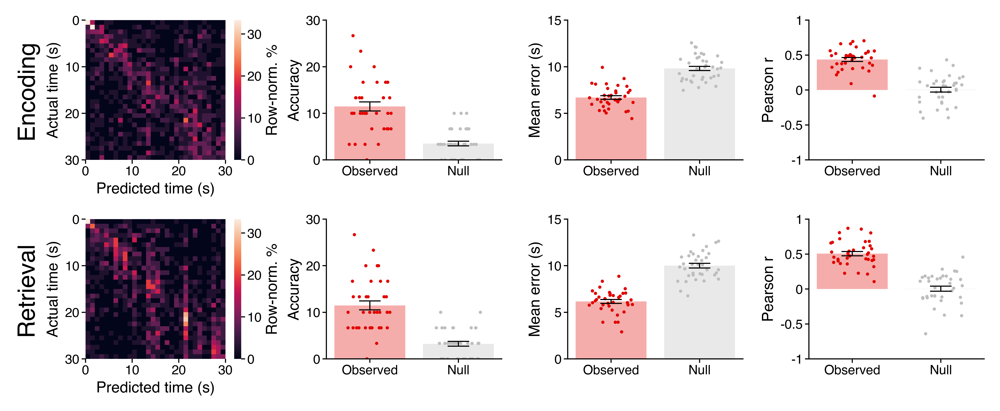

In [138]:
savefig = 0
overwrite = 0
game_states = ['Encoding', 'Retrieval']
figsize = (colws[2]*2, colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ymin_acc = 0
ymax_acc = 30
yticks_acc = [0, 10, 20, 30]
error_dist_mult = 1 # 2
ymin_error_dist = 0
ymax_error_dist = 15
yticks_error_dist = [0, 5, 10, 15]
ymin_corr = -1
ymax_corr = 1
yticks_corr = [-1, -0.5, 0, 0.5, 1]
vmin = 0
vmax = 33.3
cbar_ticks = [0, 10, 20, 30]
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
add_cbar = True
plot_decode = True
plot_xdecode = False
plot_null = True
alpha = 0.15 #0.3
linewidth = 1 # 0.6
fliersize = 2.5

# -----------------------------------------
plt.close()
fig, ax = plt.subplots(2, 4, dpi=dpi, figsize=figsize)
ax = np.ravel(ax)

for iState, game_state in enumerate(game_states):
    clf_dat = clf_results.query("(gameState=='{}')".format(game_state))
    n_test = 1 # len(clf_dat.iloc[0]['test_trials'])
    n_time_steps = clf_dat.iloc[0]['n_time_steps']
    reshp = [n_test, n_time_steps]
    if game_state[:5] == 'Delay':
        xticks = np.linspace(0, n_time_steps, num=6)
        xticklabels = [0, 2, 4, 6, 8, 10]
    else:
        xticks = np.linspace(0, n_time_steps, num=4)
        xticklabels = [0, 10, 20, 30]
    
    # Run stats.
    _mean, _sem = clf_dat['mean_acc'].mean(), stats.sem(clf_dat['mean_acc'])
    _mean_null, _sem_null = clf_dat['mean_acc_null'].mean(), stats.sem(clf_dat['mean_acc_null'])
    print('{}\n{}'.format(game_state, '-' * len(game_state)),
          'Accuracy',
          'within-decoding: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean * 100, _sem, clf_dat['mean_acc'].max()),
          'within null: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean_null * 100, _sem_null, clf_dat['mean_acc_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_acc'], clf_dat['mean_acc_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
    
    _mean, _sem = clf_dat['mean_abs_error_dist'].mean(), stats.sem(clf_dat['mean_abs_error_dist'])
    _mean_null, _sem_null = clf_dat['mean_abs_error_dist_null'].mean(), stats.sem(clf_dat['mean_abs_error_dist_null'])
    print('',
          'Error distance',
          'within-decoding: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean, _sem, clf_dat['mean_abs_error_dist'].max()),
          'within null: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['mean_abs_error_dist_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_abs_error_dist'], clf_dat['mean_abs_error_dist_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    _mean, _sem = clf_dat['pred_corr'].mean(), stats.sem(clf_dat['pred_corr'])
    _mean_null, _sem_null = clf_dat['pred_corr_null'].mean(), stats.sem(clf_dat['pred_corr_null'])
    print('',
          'Actual vs. predicted time correlation',
          'within-decoding: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean, _sem, clf_dat['pred_corr'].min(), clf_dat['pred_corr'].max()),
          'within null: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['pred_corr_null'].min(), clf_dat['pred_corr_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['pred_corr'], clf_dat['pred_corr_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    print('')
    
    # Make plots.
    iax = (4 * iState) - 1
    
    # Within-state confusion matrix.
    if plot_decode:
        iax += 1
        cmat = np.mean(clf_dat.apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(), axis=0) * 100
        print('cmat max: {:.3f}'.format(cmat.max()), end='\n\n')
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()

        ax[iax].text(x=ax[iax].get_xlim()[0] - (np.diff(ax[iax].get_xlim()) * 0.5), # 0.4
                     y=np.mean(ax[iax].get_ylim()),
                     s=game_state.replace('Delay', 'Delay '),
                     fontsize=font['fig'], rotation=90, va='center')
    
    # Cross-decoder confusion matrix.
    if plot_xdecode:
        iax += 1
        cmat = np.mean(xclf_dat.apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(), axis=0)
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()
    
    iax += 1
    # Mean accuracy across time bins.
    mean_acc = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_acc'].tolist())).T,
                                       np.vstack((['null'] * len(clf_dat), clf_dat['mean_acc_null'].tolist())).T)),
                            columns=['level', 'value'])
    mean_acc['level'] = mean_acc['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_acc['value'] = mean_acc['value'].astype(float)
    mean_acc['value'] *= 100
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_acc['level'].unique().size), mean_acc.groupby('level')['value'].mean().values,
                     yerr=mean_acc.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_acc, ymax_acc])
    ax[iax].set_yticks(yticks_acc)
    ax[iax].set_yticklabels(yticks_acc, fontsize=font['tick'])
    ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean error across time bins.
    mean_errors = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_abs_error_dist'].tolist())).T,
                                          np.vstack((['null'] * len(clf_dat), clf_dat['mean_abs_error_dist_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_errors['level'] = mean_errors['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_errors['value'] = mean_errors['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_errors['level'].unique().size), mean_errors.groupby('level')['value'].mean().values,
                     yerr=mean_errors.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
    ax[iax].set_yticks(yticks_error_dist)
    ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
    ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean correlation across time.
    mean_corrs = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['pred_corr'].tolist())).T,
                                         np.vstack((['null'] * len(clf_dat), clf_dat['pred_corr_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_corrs['level'] = mean_corrs['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_corrs['value'] = mean_corrs['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_corrs['level'].unique().size), mean_corrs.groupby('level')['value'].mean().values,
                     yerr=mean_corrs.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_corr, ymax_corr])
    ax[iax].set_yticks(yticks_corr)
    ax[iax].set_yticklabels(yticks_corr, fontsize=font['tick'])
    ax[iax].set_ylabel('Pearson r', fontsize=font['label'], labelpad=labelpad)
    
#     iax += 1
#     # Accuracy.
#     if plot_decode:
#         _means = np.mean(clf_dat['acc_by_time'].tolist(), axis=0)
#         _sems = stats.sem(clf_dat['acc_by_time'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#e10600', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=5)
#     if plot_xdecode:
#         _means = np.mean(xclf_dat['acc_by_time'].tolist(), axis=0)
#         _sems = stats.sem(xclf_dat['acc_by_time'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#296eb4', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=4)
#     if plot_null:
#         _means = np.mean(clf_dat['acc_by_time_null'].tolist(), axis=0)
#         _sems = stats.sem(clf_dat['acc_by_time_null'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#bebebe', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=3)
#     for axis in ['left', 'bottom']:
#         ax[iax].spines[axis].set_linewidth(spine_lw)
#     ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#     _xticks = xticks - 0.5
#     ax[iax].set_xlim([-0.5, xvals.size-0.5])
#     ax[iax].set_xticks(_xticks)
#     ax[iax].set_xticklabels(xticklabels)
#     ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
#     ax[iax].set_ylim([ymin_acc, ymax_acc])
#     ax[iax].set_yticks(yticks_acc)
#     ax[iax].set_yticklabels([int(x*100) for x in yticks_acc], fontsize=font['tick'])
#     ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
#     iax += 1
#     # Error distance.
#     if plot_decode:
#         _means = np.mean(np.abs(clf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(clf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#e10600', linewidth=0, alpha=alpha, zorder=2)
#         ax[iax].plot(xvals, _means, color='#e10600', linewidth=linewidth,
#                      linestyle='-', zorder=5) # , marker='o', markersize=font['annot']/3
#     if plot_xdecode:
#         _means = np.mean(np.abs(xclf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(xclf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#296eb4', linewidth=0, alpha=alpha, zorder=1)
#         ax[iax].plot(xvals, _means, color='#296eb4', linewidth=linewidth,
#                      linestyle='-', zorder=4) # , marker='o', markersize=font['annot']/3
#     if plot_null:
#         _means = np.mean(np.abs(clf_dat['error_dist_null'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(clf_dat['error_dist_null'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#bebebe', linewidth=0, alpha=alpha, zorder=0)
#         ax[iax].plot(xvals, _means, color='#bebebe', linewidth=linewidth,
#                      linestyle='-', zorder=3) # , marker='o', markersize=font['annot']/3
#     for axis in ['left', 'bottom']:
#         ax[iax].spines[axis].set_linewidth(spine_lw)
#     ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#     _xticks = xticks - 0.5
#     ax[iax].set_xlim([-0.5, xvals.size-0.5])
#     ax[iax].set_xticks(_xticks)
#     ax[iax].set_xticklabels(xticklabels)
#     ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
#     ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
#     ax[iax].set_yticks(yticks_error_dist)
#     ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
#     ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
        
fig.tight_layout(pad=0.25, h_pad=1)

if savefig:
    filename = op.join(proj_dir, 'figs', 'classifiers', 
                       'SVC_predicting_time_step-{}units-random_search-36fold-{}_{}bins-{}_{}bins.pdf'
                       .format(n_units, game_states[0], n_time_steps, game_states[1], n_time_steps))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight')
        
fig.show()

# Time cell time classifiers for each trial interval, separately, dropping first 2s

In [68]:
# Train classifiers to predict time in each game state,
# using only significant time cells for that game state.
game_states = ['Delay1', 'Delay2', 'Encoding', 'Retrieval']
time_steps_per_game_state={'Delay1': 10, 'Encoding': 30, 'Delay2': 10, 'Retrieval': 30}
drop_first2 = True
save_results = True
overwrite = False
verbose = True

start_time = time()

# Select only time cells.
qry = "(gameState=='{}') & (testvar=='time') & (sig==True) & (beta_abs_max>0)"
unit_groups = od({game_state: ols_pairs.query(qry.format(game_state))['subj_sess_unit'].unique()
                  for game_state in game_states})

# Do classification.
for game_state in game_states:
    _unit_groups = {game_state: unit_groups[game_state]}
    clf_results = pop_decoding.classify_time(unit_groups=_unit_groups,
                                             game_states=[game_state],
                                             time_steps_per_game_state=time_steps_per_game_state,
                                             drop_first2=drop_first2,
                                             proj_dir=proj_dir,
                                             save_results=save_results,
                                             overwrite=overwrite,
                                             verbose=verbose)

print('Done in {:.1f}s'.format(time() - start_time))

Delay1: Fitting 58 neurons from Delay1, 0.0 min
Saved /home1/dscho/projects/time_cells/analysis/classifiers/SVC_predicting_time_step-58units_Delay1-random_search-36fold-Delay1_10bins-drop_first2s.pkl
Done in 11.7 min
Delay2: Fitting 46 neurons from Delay2, 0.1 min
Saved /home1/dscho/projects/time_cells/analysis/classifiers/SVC_predicting_time_step-46units_Delay2-random_search-36fold-Delay2_10bins-drop_first2s.pkl
Done in 11.0 min
Encoding: Fitting 52 neurons from Encoding, 0.1 min
Saved /home1/dscho/projects/time_cells/analysis/classifiers/SVC_predicting_time_step-52units_Encoding-random_search-36fold-Encoding_30bins-drop_first2s.pkl
Done in 38.1 min
Retrieval: Fitting 44 neurons from Retrieval, 0.1 min
Saved /home1/dscho/projects/time_cells/analysis/classifiers/SVC_predicting_time_step-44units_Retrieval-random_search-36fold-Retrieval_30bins-drop_first2s.pkl
Done in 42.8 min
Done in 6208.9s


In [ ]:
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
n_units = 457
drop_first2 = True
time_steps_per_game_state = {'Delay1': 5,
                             'Encoding': 15,
                             'Delay2': 5,
                             'Retrieval': 15}
# time_steps_per_game_state = {'Delay1': 10,
#                              'Encoding': 30,
#                              'Delay2': 10,
#                              'Retrieval': 30}

drop_first2 = '-drop_first2s' if drop_first2 else ''
filename = op.join(proj_dir, 'analysis', 'classifiers',
                   'SVC_predicting_time_step-{}units_all-random_search-36fold-Delay1_{}bins-Delay2_{}bins-Encoding_{}bins-Retrieval_{}bins{}.pkl'
                   .format(n_units, time_steps_per_game_state['Delay1'], time_steps_per_game_state['Delay2'], time_steps_per_game_state['Encoding'],
                           time_steps_per_game_state['Retrieval'], drop_first2))
clf_results = dio.open_pickle(filename)

# --------------------------
# Resort y_test_null and y_test_pred_null on the values within each y_test_null test trial.
def sort_onto(sort_on, 
              apply_to, 
              n_split=1):
    """Sort the values within each split of sort_on.
    
    Apply the sorting indices to apply_to."""
    # Split the input vectors.
    sort_on = np.split(np.array(sort_on), n_split)
    apply_to = np.split(np.array(apply_to), n_split)
    
    v_out = []
    for iSplit in range(len(sort_on)):
        v_out += list(apply_to[iSplit][np.argsort(sort_on[iSplit])])
    
    return v_out

for _df in (clf_results,):
    for col in ['y_test_pred_null', 'y_test_null']:
        _df[col] = _df.apply(lambda x: sort_onto(x['y_test_null'], x[col], len(x['test_trials'])), axis=1)

# --------------------------
# Add error distances between actual and predicted values.
def clf_error_dist(y_test, y_test_pred):
    """Return the difference between predicted and actual values."""
    return list(np.array(y_test_pred) - np.array(y_test))

for _df in (clf_results,):
    if 'error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy')+1,
                   'error_dist',
                   _df.apply(lambda x: clf_error_dist(x['y_test'], x['y_test_pred']), axis=1))
    if 'error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy_null')+1,
                   'error_dist_null',
                   _df.apply(lambda x: clf_error_dist(x['y_test_null'], x['y_test_pred_null']), axis=1))
    if 'mean_abs_error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist')+1,
                   'mean_abs_error_dist',
                   _df['error_dist'].apply(lambda x: np.mean(np.abs(x))).tolist())
    if 'mean_abs_error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist_null')+1,
                   'mean_abs_error_dist_null',
                   _df['error_dist_null'].apply(lambda x: np.mean(np.abs(x))).tolist())
        
null_error_dists = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: np.abs(x.tolist())) # game_state: trial x time
null_error_time = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=0), stats.sem(np.abs(x.tolist()), axis=0)]) # game_state: time
null_error_trial = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=1), stats.sem(np.abs(x.tolist()), axis=1)]) # game_state: trial

# Convert test_trials from list to int for LOO-CV where only one trial is tested at a time.
clf_results['test_trials'] = clf_results['test_trials'].apply(lambda x: int(x[0]))

# Add correlations between actual and predicted times, by trial.
clf_results['pred_corr'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred'], x['y_test'])[0], axis=1).fillna(0)
clf_results['pred_corr_null'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred_null'], x['y_test_null'])[0], axis=1).fillna(0)

print(clf_results.shape)

In [ ]:
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
n_units = {'Delay1': 58,
           'Encoding': 52,
           'Delay2': 46,
           'Retrieval': 44}
time_steps_per_game_state = {'Delay1': 10,
                             'Encoding': 30,
                             'Delay2': 10,
                             'Retrieval': 30}

filenames = [op.join(proj_dir, 'analysis', 'classifiers', 
                     'SVC_predicting_time_step-{}units_{}-random_search-36fold-{}_{}bins-drop_first2s.pkl'
                     .format(n_units[game_state], game_state, game_state, time_steps_per_game_state[game_state]))
             for game_state in game_states]

clf_results = pd.concat([dio.open_pickle(filename) for filename in filenames])

# --------------------------
# Resort y_test_null and y_test_pred_null on the values within each y_test_null test trial.
def sort_onto(sort_on, 
              apply_to, 
              n_split=1):
    """Sort the values within each split of sort_on.
    
    Apply the sorting indices to apply_to."""
    # Split the input vectors.
    sort_on = np.split(np.array(sort_on), n_split)
    apply_to = np.split(np.array(apply_to), n_split)
    
    v_out = []
    for iSplit in range(len(sort_on)):
        v_out += list(apply_to[iSplit][np.argsort(sort_on[iSplit])])
    
    return v_out

for _df in (clf_results,):
    for col in ['y_test_pred_null', 'y_test_null']:
        _df[col] = _df.apply(lambda x: sort_onto(x['y_test_null'], x[col], len(x['test_trials'])), axis=1)

# --------------------------
# Add error distances between actual and predicted values.
def clf_error_dist(y_test, y_test_pred):
    """Return the difference between predicted and actual values."""
    return list(np.array(y_test_pred) - np.array(y_test))

for _df in (clf_results,):
    if 'error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy')+1,
                   'error_dist',
                   _df.apply(lambda x: clf_error_dist(x['y_test'], x['y_test_pred']), axis=1))
    if 'error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy_null')+1,
                   'error_dist_null',
                   _df.apply(lambda x: clf_error_dist(x['y_test_null'], x['y_test_pred_null']), axis=1))
    if 'mean_abs_error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist')+1,
                   'mean_abs_error_dist',
                   _df['error_dist'].apply(lambda x: np.mean(np.abs(x))).tolist())
    if 'mean_abs_error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist_null')+1,
                   'mean_abs_error_dist_null',
                   _df['error_dist_null'].apply(lambda x: np.mean(np.abs(x))).tolist())
        
null_error_dists = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: np.abs(x.tolist())) # game_state: trial x time
null_error_time = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=0), stats.sem(np.abs(x.tolist()), axis=0)]) # game_state: time
null_error_trial = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=1), stats.sem(np.abs(x.tolist()), axis=1)]) # game_state: trial

# Convert test_trials from list to int for LOO-CV where only one trial is tested at a time.
clf_results['test_trials'] = clf_results['test_trials'].apply(lambda x: int(x[0]))

# Add correlations between actual and predicted times, by trial.
clf_results['pred_corr'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred'], x['y_test'])[0], axis=1).fillna(0)
clf_results['pred_corr_null'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred_null'], x['y_test_null'])[0], axis=1).fillna(0)

print(clf_results.shape)

Delay1
------
Accuracy
within-decoding: 40.0 ± 3.4%, max = 1.000
within null: 21.7 ± 3.2%, max = 0.600
within_vs_null: T(35) = 4.2, P = 0.000188, P_holm = 0.000188, reject = True

Error distance
within-decoding: 0.9 ± 0.05, max = 1.400
within null: 1.7 ± 0.08, max = 2.600
within_vs_null: T(35) = -9.5, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
within-decoding: 0.681 ± 0.034, min = 0.213, max = 1.000
within null: -0.165 ± 0.082, min = -0.962, max = 0.849
within_vs_null: T(35) = 10.7, P = 0.000000, P_holm = 0.000000, reject = True

cmat max: 80.556

Delay2
------
Accuracy
within-decoding: 37.2 ± 3.5%, max = 0.800
within null: 23.9 ± 2.9%, max = 0.600
within_vs_null: T(35) = 3.2, P = 0.003228, P_holm = 0.003228, reject = True

Error distance
within-decoding: 1.1 ± 0.08, max = 2.200
within null: 1.5 ± 0.08, max = 2.800
within_vs_null: T(35) = -4.3, P = 0.000140, P_holm = 0.000140, reject = True

Actual vs. predicted time correlation
within-decodin

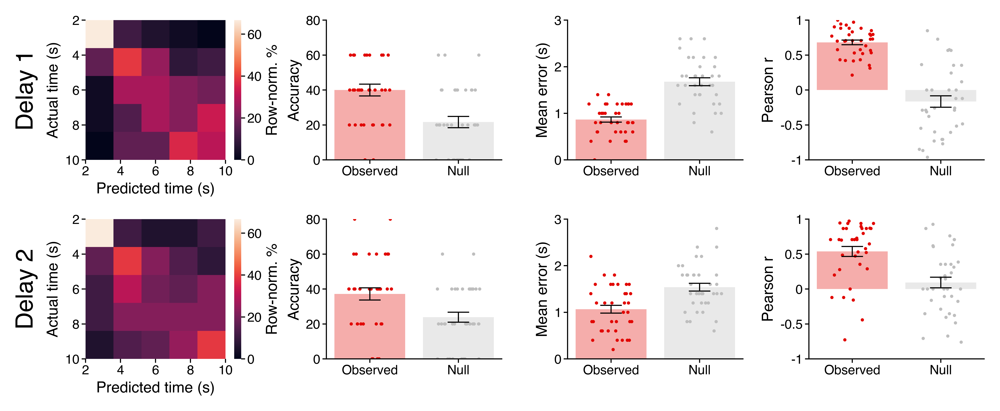

In [31]:
savefig = 0
overwrite = 0
game_states = ['Delay1', 'Delay2']
figsize = (colws[2]*2, colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ymin_acc = 0
ymax_acc = 80
yticks_acc = [0, 20, 40, 60, 80]
error_dist_mult = 1 # 2
ymin_error_dist = 0
ymax_error_dist = 3 # 6
yticks_error_dist = [0, 1, 2, 3] # [0, 2, 4, 6]
ymin_corr = -1
ymax_corr = 1
yticks_corr = [-1, -0.5, 0, 0.5, 1]
vmin = 0 
vmax = 66.67 # 33.333
cbar_ticks = [0, 20, 40, 60] # [0, 10, 20, 30]
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
add_cbar = True
plot_decode = True
plot_xdecode = False
plot_null = True
alpha = 0.15 #0.3
linewidth = 1 # 0.6
fliersize = 2.5

# -----------------------------------------
plt.close()
fig, ax = plt.subplots(2, 4, dpi=dpi, figsize=figsize)
ax = np.ravel(ax)

for iState, game_state in enumerate(game_states):
    clf_dat = clf_results.query("(gameState=='{}')".format(game_state))
    n_test = 1 # len(clf_dat.iloc[0]['test_trials'])
    n_time_steps = clf_dat.iloc[0]['n_time_steps']
    reshp = [n_test, n_time_steps]
    if game_state[:5] == 'Delay':
        xticks = np.linspace(0, n_time_steps, num=5)
        xticklabels = [2, 4, 6, 8, 10]
    else:
        xticks = np.linspace(0, n_time_steps, num=5)
        xticklabels = [2, 9, 16, 23, 30]
    
    # Run stats.
    _mean, _sem = clf_dat['mean_acc'].mean(), stats.sem(clf_dat['mean_acc'])
    _mean_null, _sem_null = clf_dat['mean_acc_null'].mean(), stats.sem(clf_dat['mean_acc_null'])
    print('{}\n{}'.format(game_state, '-' * len(game_state)),
          'Accuracy',
          'within-decoding: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean * 100, _sem, clf_dat['mean_acc'].max()),
          'within null: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean_null * 100, _sem_null, clf_dat['mean_acc_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_acc'], clf_dat['mean_acc_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
    
    _mean, _sem = clf_dat['mean_abs_error_dist'].mean(), stats.sem(clf_dat['mean_abs_error_dist'])
    _mean_null, _sem_null = clf_dat['mean_abs_error_dist_null'].mean(), stats.sem(clf_dat['mean_abs_error_dist_null'])
    print('',
          'Error distance',
          'within-decoding: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean, _sem, clf_dat['mean_abs_error_dist'].max()),
          'within null: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['mean_abs_error_dist_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_abs_error_dist'], clf_dat['mean_abs_error_dist_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    _mean, _sem = clf_dat['pred_corr'].mean(), stats.sem(clf_dat['pred_corr'])
    _mean_null, _sem_null = clf_dat['pred_corr_null'].mean(), stats.sem(clf_dat['pred_corr_null'])
    print('',
          'Actual vs. predicted time correlation',
          'within-decoding: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean, _sem, clf_dat['pred_corr'].min(), clf_dat['pred_corr'].max()),
          'within null: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['pred_corr_null'].min(), clf_dat['pred_corr_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['pred_corr'], clf_dat['pred_corr_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    print('')
    
    # Make plots.
    iax = (4 * iState) - 1
    
    # Within-state confusion matrix.
    if plot_decode:
        iax += 1
        cmat = np.mean(clf_dat.apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(), axis=0) * 100
        print('cmat max: {:.3f}'.format(cmat.max()), end='\n\n')
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()

        ax[iax].text(x=ax[iax].get_xlim()[0] - (np.diff(ax[iax].get_xlim()) * 0.5), # 0.4
                     y=np.mean(ax[iax].get_ylim()),
                     s=game_state.replace('Delay', 'Delay '),
                     fontsize=font['fig'], rotation=90, va='center')
    
    # Cross-decoder confusion matrix.
    if plot_xdecode:
        iax += 1
        cmat = np.mean(xclf_dat.apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(), axis=0)
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()
    
    iax += 1
    # Mean accuracy across time bins.
    mean_acc = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_acc'].tolist())).T,
                                       np.vstack((['null'] * len(clf_dat), clf_dat['mean_acc_null'].tolist())).T)),
                            columns=['level', 'value'])
    mean_acc['level'] = mean_acc['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_acc['value'] = mean_acc['value'].astype(float)
    mean_acc['value'] *= 100
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_acc['level'].unique().size), mean_acc.groupby('level')['value'].mean().values,
                     yerr=mean_acc.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_acc, ymax_acc])
    ax[iax].set_yticks(yticks_acc)
    ax[iax].set_yticklabels(yticks_acc, fontsize=font['tick'])
    ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean error across time bins.
    mean_errors = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_abs_error_dist'].tolist())).T,
                                          np.vstack((['null'] * len(clf_dat), clf_dat['mean_abs_error_dist_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_errors['level'] = mean_errors['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_errors['value'] = mean_errors['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_errors['level'].unique().size), mean_errors.groupby('level')['value'].mean().values,
                     yerr=mean_errors.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
    ax[iax].set_yticks(yticks_error_dist)
    ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
    ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean correlation across time.
    mean_corrs = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['pred_corr'].tolist())).T,
                                         np.vstack((['null'] * len(clf_dat), clf_dat['pred_corr_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_corrs['level'] = mean_corrs['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_corrs['value'] = mean_corrs['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_corrs['level'].unique().size), mean_corrs.groupby('level')['value'].mean().values,
                     yerr=mean_corrs.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_corr, ymax_corr])
    ax[iax].set_yticks(yticks_corr)
    ax[iax].set_yticklabels(yticks_corr, fontsize=font['tick'])
    ax[iax].set_ylabel('Pearson r', fontsize=font['label'], labelpad=labelpad)
    
#     iax += 1
#     # Accuracy.
#     if plot_decode:
#         _means = np.mean(clf_dat['acc_by_time'].tolist(), axis=0)
#         _sems = stats.sem(clf_dat['acc_by_time'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#e10600', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=5)
#     if plot_xdecode:
#         _means = np.mean(xclf_dat['acc_by_time'].tolist(), axis=0)
#         _sems = stats.sem(xclf_dat['acc_by_time'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#296eb4', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=4)
#     if plot_null:
#         _means = np.mean(clf_dat['acc_by_time_null'].tolist(), axis=0)
#         _sems = stats.sem(clf_dat['acc_by_time_null'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#bebebe', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=3)
#     for axis in ['left', 'bottom']:
#         ax[iax].spines[axis].set_linewidth(spine_lw)
#     ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#     _xticks = xticks - 0.5
#     ax[iax].set_xlim([-0.5, xvals.size-0.5])
#     ax[iax].set_xticks(_xticks)
#     ax[iax].set_xticklabels(xticklabels)
#     ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
#     ax[iax].set_ylim([ymin_acc, ymax_acc])
#     ax[iax].set_yticks(yticks_acc)
#     ax[iax].set_yticklabels([int(x*100) for x in yticks_acc], fontsize=font['tick'])
#     ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
#     iax += 1
#     # Error distance.
#     if plot_decode:
#         _means = np.mean(np.abs(clf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(clf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#e10600', linewidth=0, alpha=alpha, zorder=2)
#         ax[iax].plot(xvals, _means, color='#e10600', linewidth=linewidth,
#                      linestyle='-', zorder=5) # , marker='o', markersize=font['annot']/3
#     if plot_xdecode:
#         _means = np.mean(np.abs(xclf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(xclf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#296eb4', linewidth=0, alpha=alpha, zorder=1)
#         ax[iax].plot(xvals, _means, color='#296eb4', linewidth=linewidth,
#                      linestyle='-', zorder=4) # , marker='o', markersize=font['annot']/3
#     if plot_null:
#         _means = np.mean(np.abs(clf_dat['error_dist_null'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(clf_dat['error_dist_null'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#bebebe', linewidth=0, alpha=alpha, zorder=0)
#         ax[iax].plot(xvals, _means, color='#bebebe', linewidth=linewidth,
#                      linestyle='-', zorder=3) # , marker='o', markersize=font['annot']/3
#     for axis in ['left', 'bottom']:
#         ax[iax].spines[axis].set_linewidth(spine_lw)
#     ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#     _xticks = xticks - 0.5
#     ax[iax].set_xlim([-0.5, xvals.size-0.5])
#     ax[iax].set_xticks(_xticks)
#     ax[iax].set_xticklabels(xticklabels)
#     ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
#     ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
#     ax[iax].set_yticks(yticks_error_dist)
#     ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
#     ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
        
fig.tight_layout(pad=0.25, h_pad=1)

if savefig:
    filename = op.join(proj_dir, 'figs', 'classifiers', 
                       'SVC_predicting_time_step-{}units-random_search-36fold-{}_{}bins-{}_{}bins-drop_first2s.pdf'
                       .format(n_units, game_states[0], n_time_steps, game_states[1], n_time_steps))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight')
        
fig.show()

Encoding
--------
Accuracy
within-decoding: 15.8 ± 1.2%, max = 0.400
within null: 3.2 ± 0.4%, max = 0.100
within_vs_null: T(35) = 8.6, P = 0.000000, P_holm = 0.000000, reject = True

Error distance
within-decoding: 4.5 ± 0.2, max = 7.400
within null: 10.1 ± 0.2, max = 14.500
within_vs_null: T(35) = -16.0, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
within-decoding: 0.725 ± 0.021, min = 0.427, max = 0.897
within null: -0.023 ± 0.036, min = -0.457, max = 0.561
within_vs_null: T(35) = 16.5, P = 0.000000, P_holm = 0.000000, reject = True

cmat max: 88.889

Retrieval
---------
Accuracy
within-decoding: 13.8 ± 1.0%, max = 0.333
within null: 3.0 ± 0.5%, max = 0.100
within_vs_null: T(35) = 9.3, P = 0.000000, P_holm = 0.000000, reject = True

Error distance
within-decoding: 4.8 ± 0.2, max = 7.167
within null: 10.1 ± 0.3, max = 13.133
within_vs_null: T(35) = -15.1, P = 0.000000, P_holm = 0.000000, reject = True

Actual vs. predicted time correlation
with

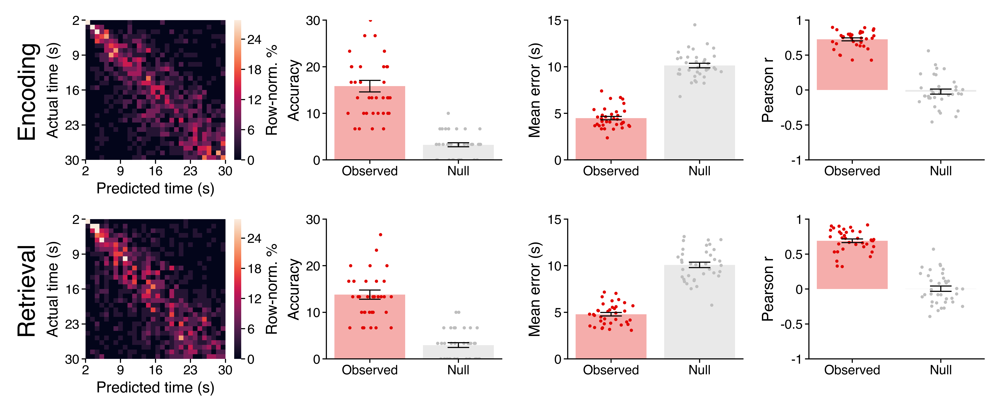

In [29]:
savefig = 0
overwrite = 0
game_states = ['Encoding', 'Retrieval']
figsize = (colws[2]*2, colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ymin_acc = 0
ymax_acc = 30
yticks_acc = [0, 10, 20, 30]
error_dist_mult = 1 # 2
ymin_error_dist = 0
ymax_error_dist = 15
yticks_error_dist = [0, 5, 10, 15]
ymin_corr = -1
ymax_corr = 1
yticks_corr = [-1, -0.5, 0, 0.5, 1]
vmin = 0
vmax = 27.778
cbar_ticks = [0, 6, 12, 18, 24]
spine_lw = 0.5
spine_len = 1.8
labelpad = 2
add_cbar = True
plot_decode = True
plot_xdecode = False
plot_null = True
alpha = 0.15 #0.3
linewidth = 1 # 0.6
fliersize = 2.5

# -----------------------------------------
plt.close()
fig, ax = plt.subplots(2, 4, dpi=dpi, figsize=figsize)
ax = np.ravel(ax)

for iState, game_state in enumerate(game_states):
    clf_dat = clf_results.query("(gameState=='{}')".format(game_state))
    n_test = 1 # len(clf_dat.iloc[0]['test_trials'])
    n_time_steps = clf_dat.iloc[0]['n_time_steps']
    reshp = [n_test, n_time_steps]
    if game_state[:5] == 'Delay':
        xticks = np.linspace(0, n_time_steps, num=5)
        xticklabels = [2, 4, 6, 8, 10]
    else:
        xticks = np.linspace(0, n_time_steps, num=5)
        xticklabels = [2, 9, 16, 23, 30]
    
    # Run stats.
    _mean, _sem = clf_dat['mean_acc'].mean(), stats.sem(clf_dat['mean_acc'])
    _mean_null, _sem_null = clf_dat['mean_acc_null'].mean(), stats.sem(clf_dat['mean_acc_null'])
    print('{}\n{}'.format(game_state, '-' * len(game_state)),
          'Accuracy',
          'within-decoding: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean * 100, _sem, clf_dat['mean_acc'].max()),
          'within null: {:.1f} ± {:.1%}, max = {:.3f}'.format(_mean_null * 100, _sem_null, clf_dat['mean_acc_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_acc'], clf_dat['mean_acc_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
    
    _mean, _sem = clf_dat['mean_abs_error_dist'].mean(), stats.sem(clf_dat['mean_abs_error_dist'])
    _mean_null, _sem_null = clf_dat['mean_abs_error_dist_null'].mean(), stats.sem(clf_dat['mean_abs_error_dist_null'])
    print('',
          'Error distance',
          'within-decoding: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean, _sem, clf_dat['mean_abs_error_dist'].max()),
          'within null: {:.1f} ± {:.1}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['mean_abs_error_dist_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['mean_abs_error_dist'], clf_dat['mean_abs_error_dist_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    _mean, _sem = clf_dat['pred_corr'].mean(), stats.sem(clf_dat['pred_corr'])
    _mean_null, _sem_null = clf_dat['pred_corr_null'].mean(), stats.sem(clf_dat['pred_corr_null'])
    print('',
          'Actual vs. predicted time correlation',
          'within-decoding: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean, _sem, clf_dat['pred_corr'].min(), clf_dat['pred_corr'].max()),
          'within null: {:.3f} ± {:.3f}, min = {:.3f}, max = {:.3f}'.format(_mean_null, _sem_null, clf_dat['pred_corr_null'].min(), clf_dat['pred_corr_null'].max()),
          sep='\n')
    ttests = od([('within_vs_null', stats.ttest_rel(clf_dat['pred_corr'], clf_dat['pred_corr_null']))])
    df = len(clf_dat) - 1
    pvals_holm = sm.stats.multipletests([_test[1] for _test in ttests.values()], alpha=0.05, method='holm')
    for iTest, _test in enumerate(ttests):
        ttests[_test] = {'tstat': ttests[_test][0],
                         'pval': ttests[_test][1],
                         'pval_holm': pvals_holm[1][iTest],
                         'sig_holm': pvals_holm[0][iTest]}
        print('{}: T({}) = {:.1f}, P = {:.6f}, P_holm = {:.6f}, reject = {}'
              .format(_test, df, ttests[_test]['tstat'], ttests[_test]['pval'], ttests[_test]['pval_holm'], ttests[_test]['sig_holm']))
        
    print('')
    
    # Make plots.
    iax = (4 * iState) - 1
    
    # Within-state confusion matrix.
    if plot_decode:
        iax += 1
        cmat = np.mean(clf_dat.apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(), axis=0) * 100
        print('cmat max: {:.3f}'.format(cmat.max()), end='\n\n')
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()

        ax[iax].text(x=ax[iax].get_xlim()[0] - (np.diff(ax[iax].get_xlim()) * 0.5), # 0.4
                     y=np.mean(ax[iax].get_ylim()),
                     s=game_state.replace('Delay', 'Delay '),
                     fontsize=font['fig'], rotation=90, va='center')
    
    # Cross-decoder confusion matrix.
    if plot_xdecode:
        iax += 1
        cmat = np.mean(xclf_dat.apply(lambda x: confusion_matrix(x['y_test'], x['y_test_pred'], normalize='true'), axis=1).tolist(), axis=0)
        vmin = vmin
        vmax = vmax
        ax[iax] = sns.heatmap(cmat, vmin=vmin, vmax=vmax, square=True, ax=ax[iax])
        ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
        _xticks = xticks
        ax[iax].set_xlim((_xticks.min(), _xticks.max()))
        ax[iax].set_xticks(_xticks)
        ax[iax].set_xticklabels(xticklabels)
        ax[iax].set_yticks(ax[iax].get_xticks())
        ax[iax].set_yticklabels(ax[iax].get_xticklabels(), rotation=0)
        ax[iax].set_xlabel('Predicted time (s)', fontsize=font['label'], labelpad=labelpad)
        ax[iax].set_ylabel('Actual time (s)', fontsize=font['label'], labelpad=labelpad)
        if add_cbar:
            cbar = ax[iax].collections[0].colorbar
            cbar.ax.tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
            cbar.set_ticks(cbar_ticks)
            cbar.set_ticklabels(cbar_ticks)
            cbar.set_label('Row-norm. %', fontsize=font['label'], labelpad=labelpad)
        else:
            ax[iax].collections[0].colorbar.remove()
    
    iax += 1
    # Mean accuracy across time bins.
    mean_acc = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_acc'].tolist())).T,
                                       np.vstack((['null'] * len(clf_dat), clf_dat['mean_acc_null'].tolist())).T)),
                            columns=['level', 'value'])
    mean_acc['level'] = mean_acc['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_acc['value'] = mean_acc['value'].astype(float)
    mean_acc['value'] *= 100
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_acc, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_acc['level'].unique().size), mean_acc.groupby('level')['value'].mean().values,
                     yerr=mean_acc.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_acc, ymax_acc])
    ax[iax].set_yticks(yticks_acc)
    ax[iax].set_yticklabels(yticks_acc, fontsize=font['tick'])
    ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean error across time bins.
    mean_errors = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['mean_abs_error_dist'].tolist())).T,
                                          np.vstack((['null'] * len(clf_dat), clf_dat['mean_abs_error_dist_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_errors['level'] = mean_errors['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_errors['value'] = mean_errors['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_errors, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_errors['level'].unique().size), mean_errors.groupby('level')['value'].mean().values,
                     yerr=mean_errors.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
    ax[iax].set_yticks(yticks_error_dist)
    ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
    ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
    
    iax += 1
    # Mean correlation across time.
    mean_corrs = pd.DataFrame(np.vstack((np.vstack((['matched'] * len(clf_dat), clf_dat['pred_corr'].tolist())).T,
                                         np.vstack((['null'] * len(clf_dat), clf_dat['pred_corr_null'].tolist())).T)),
                               columns=['level', 'value'])
    mean_corrs['level'] = mean_corrs['level'].astype(pd.CategoricalDtype(['matched', 'null'], ordered=True))
    mean_corrs['value'] = mean_corrs['value'].astype(float)
    sns.set_context(rc={'patch.linewidth': spine_lw})
    ax[iax] = sns.barplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                          ci=None,
                          palette=['#e10600', '#bebebe'],
                          saturation=1, alpha=0.33, zorder=0)
    ax[iax] = sns.stripplot(x='level', y='value', data=mean_corrs, ax=ax[iax],
                            palette=['#e10600', '#bebebe'],
                            size=1.5, alpha=1, jitter=0.25, zorder=1)
    ax[iax].errorbar(np.arange(mean_corrs['level'].unique().size), mean_corrs.groupby('level')['value'].mean().values,
                     yerr=mean_corrs.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
                     ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
    for axis in ['left', 'bottom']:
        ax[iax].spines[axis].set_linewidth(spine_lw)
    ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
    ax[iax].set_xticks(np.arange(mean_acc['level'].unique().size))
    ax[iax].set_xticklabels(['Observed', 'Null'], fontsize=font['tick'])
    ax[iax].set_xlabel('')
    ax[iax].set_ylim([ymin_corr, ymax_corr])
    ax[iax].set_yticks(yticks_corr)
    ax[iax].set_yticklabels(yticks_corr, fontsize=font['tick'])
    ax[iax].set_ylabel('Pearson r', fontsize=font['label'], labelpad=labelpad)
    
#     iax += 1
#     # Accuracy.
#     if plot_decode:
#         _means = np.mean(clf_dat['acc_by_time'].tolist(), axis=0)
#         _sems = stats.sem(clf_dat['acc_by_time'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#e10600', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=5)
#     if plot_xdecode:
#         _means = np.mean(xclf_dat['acc_by_time'].tolist(), axis=0)
#         _sems = stats.sem(xclf_dat['acc_by_time'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#296eb4', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=4)
#     if plot_null:
#         _means = np.mean(clf_dat['acc_by_time_null'].tolist(), axis=0)
#         _sems = stats.sem(clf_dat['acc_by_time_null'].tolist(), axis=0)
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].plot(xvals, _means, color='#bebebe', linewidth=linewidth,
#                      linestyle='-', marker='o', markersize=font['annot']/3, zorder=3)
#     for axis in ['left', 'bottom']:
#         ax[iax].spines[axis].set_linewidth(spine_lw)
#     ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#     _xticks = xticks - 0.5
#     ax[iax].set_xlim([-0.5, xvals.size-0.5])
#     ax[iax].set_xticks(_xticks)
#     ax[iax].set_xticklabels(xticklabels)
#     ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
#     ax[iax].set_ylim([ymin_acc, ymax_acc])
#     ax[iax].set_yticks(yticks_acc)
#     ax[iax].set_yticklabels([int(x*100) for x in yticks_acc], fontsize=font['tick'])
#     ax[iax].set_ylabel('Accuracy', fontsize=font['label'], labelpad=labelpad)
    
#     iax += 1
#     # Error distance.
#     if plot_decode:
#         _means = np.mean(np.abs(clf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(clf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#e10600', linewidth=0, alpha=alpha, zorder=2)
#         ax[iax].plot(xvals, _means, color='#e10600', linewidth=linewidth,
#                      linestyle='-', zorder=5) # , marker='o', markersize=font['annot']/3
#     if plot_xdecode:
#         _means = np.mean(np.abs(xclf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(xclf_dat['error_dist'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#296eb4', linewidth=0, alpha=alpha, zorder=1)
#         ax[iax].plot(xvals, _means, color='#296eb4', linewidth=linewidth,
#                      linestyle='-', zorder=4) # , marker='o', markersize=font['annot']/3
#     if plot_null:
#         _means = np.mean(np.abs(clf_dat['error_dist_null'].tolist()), axis=0) * error_dist_mult
#         _sems = stats.sem(np.abs(clf_dat['error_dist_null'].tolist()), axis=0) * error_dist_mult
#         xvals = np.arange(len(_means))
#         _xvals = np.concatenate([(xvals[0]-0.5,), xvals, (xvals[-1]+0.5,)])
#         __means = np.concatenate([(_means[0],), _means, (_means[-1],)])
#         __sems = np.concatenate([(_sems[0],), _sems, (_sems[-1],)])
#         ax[iax].fill_between(_xvals, __means + __sems, __means - __sems,
#                              color='#bebebe', linewidth=0, alpha=alpha, zorder=0)
#         ax[iax].plot(xvals, _means, color='#bebebe', linewidth=linewidth,
#                      linestyle='-', zorder=3) # , marker='o', markersize=font['annot']/3
#     for axis in ['left', 'bottom']:
#         ax[iax].spines[axis].set_linewidth(spine_lw)
#     ax[iax].tick_params(labelsize=font['tick'], pad=1, length=spine_len, width=spine_lw)
#     _xticks = xticks - 0.5
#     ax[iax].set_xlim([-0.5, xvals.size-0.5])
#     ax[iax].set_xticks(_xticks)
#     ax[iax].set_xticklabels(xticklabels)
#     ax[iax].set_xlabel('Time (s)', fontsize=font['label'], labelpad=labelpad)
#     ax[iax].set_ylim([ymin_error_dist, ymax_error_dist])
#     ax[iax].set_yticks(yticks_error_dist)
#     ax[iax].set_yticklabels(yticks_error_dist, fontsize=font['tick'])
#     ax[iax].set_ylabel('Mean error (s)', fontsize=font['label'], labelpad=labelpad)
        
fig.tight_layout(pad=0.25, h_pad=1)

if savefig:
    filename = op.join(proj_dir, 'figs', 'classifiers', 
                       'SVC_predicting_time_step-{}units-random_search-36fold-{}_{}bins-{}_{}bins-drop_first2s.pdf'
                       .format(n_units, game_states[0], n_time_steps, game_states[1], n_time_steps))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight')
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight')
        
fig.show()

# Time classification by brain region

In [6]:
drop_first2s = True
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
n_units = {'Delay1': 58,
           'Encoding': 52,
           'Delay2': 46,
           'Retrieval': 44}
time_steps_per_game_state = {'Delay1': 10,
                             'Encoding': 30,
                             'Delay2': 10,
                             'Retrieval': 30}

filename = op.join(proj_dir, 'analysis', 'classifiers', 
                   ('SVC_predicting_time_step-109units_Hippocampus-204units_MTL-69units_Frontal-75units_Temporal' +
                    '-random_search-36fold-69units_per_subset-spike_matched-Delay1_10bins-Delay2_10bins-Encoding_30bins-Retrieval_30bins.pkl'))
if drop_first2s:
    filename = filename.replace('.pkl', '-drop_first2s.pkl')
    
clf_results = dio.open_pickle(filename)

# --------------------------
# Resort y_test_null and y_test_pred_null on the values within each y_test_null test trial.
def sort_onto(sort_on, 
              apply_to, 
              n_split=1):
    """Sort the values within each split of sort_on.
    
    Apply the sorting indices to apply_to."""
    # Split the input vectors.
    sort_on = np.split(np.array(sort_on), n_split)
    apply_to = np.split(np.array(apply_to), n_split)
    
    v_out = []
    for iSplit in range(len(sort_on)):
        v_out += list(apply_to[iSplit][np.argsort(sort_on[iSplit])])
    
    return v_out

for _df in (clf_results,):
    for col in ['y_test_pred_null', 'y_test_null']:
        _df[col] = _df.apply(lambda x: sort_onto(x['y_test_null'], x[col], len(x['test_trials'])), axis=1)

# --------------------------
# Add error distances between actual and predicted values.
def clf_error_dist(y_test, y_test_pred):
    """Return the difference between predicted and actual values."""
    return list(np.array(y_test_pred) - np.array(y_test))

for _df in (clf_results,):
    if 'error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy')+1,
                   'error_dist',
                   _df.apply(lambda x: clf_error_dist(x['y_test'], x['y_test_pred']), axis=1))
    if 'error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy_null')+1,
                   'error_dist_null',
                   _df.apply(lambda x: clf_error_dist(x['y_test_null'], x['y_test_pred_null']), axis=1))
    if 'mean_abs_error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist')+1,
                   'mean_abs_error_dist',
                   _df['error_dist'].apply(lambda x: np.mean(np.abs(x))).tolist())
    if 'mean_abs_error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist_null')+1,
                   'mean_abs_error_dist_null',
                   _df['error_dist_null'].apply(lambda x: np.mean(np.abs(x))).tolist())
        
null_error_dists = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: np.abs(x.tolist())) # game_state: trial x time
null_error_time = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=0), stats.sem(np.abs(x.tolist()), axis=0)]) # game_state: time
null_error_trial = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=1), stats.sem(np.abs(x.tolist()), axis=1)]) # game_state: trial

# Convert test_trials from list to int for LOO-CV where only one trial is tested at a time.
clf_results['test_trials'] = clf_results['test_trials'].apply(lambda x: int(x[0]))

# Add correlations between actual and predicted times, by trial.
clf_results['pred_corr'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred'], x['y_test'])[0], axis=1).fillna(0)
clf_results['pred_corr_null'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred_null'], x['y_test_null'])[0], axis=1).fillna(0)

clf_results['unit_group'] = clf_results['unit_group'].astype(pd.CategoricalDtype(['Hippocampus', 'MTL', 'Frontal', 'Temporal'], ordered=True))

print(clf_results.shape)

(576, 26)


/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [8]:
clf_results.iloc[0]

gameState                                                              Delay1
unit_group                                                        Hippocampus
n_time_steps                                                                8
test_trials                                                                 1
best_trainval_score                                                  0.146429
best_trainval_C                                                        5548.7
best_trainval_gamma                                               1.50094e-09
y_test                                               [2, 3, 4, 5, 6, 7, 8, 9]
y_test_pred                                          [3, 3, 3, 3, 4, 4, 9, 8]
mean_acc                                                                0.125
acc_by_time                          [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
accuracy                    [False, True, False, False, False, False, Fals...
error_dist                                      [1, 0, -1, -2, -

In [7]:
# Dropping first 2s
def mean_sem(x):
    return '{:.2f} ± {:.2f}'.format(np.mean(x), stats.sem(x))
    
clf_results.groupby(['gameState', 'unit_group']).agg({'mean_acc': mean_sem,
                                                      'mean_abs_error_dist': mean_sem,
                                                      'pred_corr': mean_sem,
                                                      'mean_acc_null': mean_sem,
                                                      'mean_abs_error_dist_null': mean_sem,
                                                      'pred_corr_null': mean_sem,})

mean_acc mean_abs_error_dist    pred_corr  \
gameState unit_group                                                  
Delay1    Hippocampus  0.12 ± 0.02         2.37 ± 0.11  0.10 ± 0.07   
          MTL          0.17 ± 0.02         2.25 ± 0.11  0.18 ± 0.06   
          Frontal      0.15 ± 0.02         2.68 ± 0.14  0.02 ± 0.08   
          Temporal     0.14 ± 0.02         2.58 ± 0.11  0.03 ± 0.06   
Delay2    Hippocampus  0.18 ± 0.02         2.49 ± 0.13  0.13 ± 0.07   
          MTL          0.15 ± 0.02         2.61 ± 0.11  0.05 ± 0.07   
          Frontal      0.10 ± 0.02         2.62 ± 0.13  0.09 ± 0.07   
          Temporal     0.11 ± 0.01         2.41 ± 0.10  0.18 ± 0.07   
Encoding  Hippocampus  0.05 ± 0.01         8.13 ± 0.29  0.25 ± 0.04   
          MTL          0.07 ± 0.01         8.58 ± 0.24  0.12 ± 0.04   
          Frontal      0.06 ± 0.01         7.52 ± 0.24  0.34 ± 0.04   
          Temporal     0.06 ± 0.01         7.93 ± 0.23  0.17 ± 0.04   
Retrieval Hippocampus  0.06 ± 0.01         7.46 ± 0.21  0.33 ± 0.03   
          MTL          0.06 ± 0.01         8.43 ± 0.20  0.18 ± 0.04   
          Frontal      0.06 ± 0.01         7.46 ± 0.29  0.32 ± 0.04   
          Temporal     0.06 ± 0.01         7.16 ± 0.25  0.34 ± 0.04   

                      mean_acc_null mean_abs_error_dist_null pred_corr_null  
gameState unit_group                                                         
Delay1    Hippocampus   0.11 ± 0.02              2.78 ± 0.09   -0.09 ± 0.05  
          MTL           0.12 ± 0.02              2.70 ± 0.11    0.03 ± 0.06  
          Frontal       0.12 ± 0.02              2.62 ± 0.12    0.05 ± 0.07  
          Temporal      0.11 ± 0.02              2.92 ± 0.10   -0.17 ± 0.05  
Delay2    Hippocampus   0.12 ± 0.02              2.58 ± 0.11    0.05 ± 0.06  
          MTL           0.13 ± 0.01              2.60 ± 0.10    0.02 ± 0.05  
          Frontal       0.14 ± 0.02              2.57 ± 0.10    0.06 ± 0.06  
          Temporal      0.12 ± 0.01              2.87 ± 0.09   -0.10 ± 0.06  
Encoding  Hippocampus   0.03 ± 0.01              9.60 ± 0.26    0.01 ± 0.04  
          MTL           0.04 ± 0.01              9.55 ± 0.26    0.04 ± 0.04  
          Frontal       0.03 ± 0.00              9.00 ± 0.20   -0.06 ± 0.04  
          Temporal      0.04 ± 0.00              9.66 ± 0.25    0.00 ± 0.03  
Retrieval Hippocampus   0.03 ± 0.00              9.51 ± 0.22   -0.02 ± 0.03  
          MTL           0.04 ± 0.01              9.77 ± 0.22   -0.00 ± 0.03  
          Frontal       0.04 ± 0.01              9.21 ± 0.22    0.02 ± 0.03  
          Temporal      0.04 ± 0.01              9.81 ± 0.27   -0.02 ± 0.03

In [60]:
# All data
def mean_sem(x):
    return '{:.2f} ± {:.2f}'.format(np.mean(x), stats.sem(x))
    
clf_results.groupby(['gameState', 'unit_group']).agg({'mean_acc': mean_sem,
                                                      'mean_abs_error_dist': mean_sem,
                                                      'pred_corr': mean_sem,
                                                      'mean_acc_null': mean_sem,
                                                      'mean_abs_error_dist_null': mean_sem,
                                                      'pred_corr_null': mean_sem,})

mean_acc mean_abs_error_dist    pred_corr  \
gameState unit_group                                                  
Delay1    Hippocampus  0.15 ± 0.02         2.91 ± 0.10  0.17 ± 0.04   
          MTL          0.14 ± 0.02         2.90 ± 0.11  0.17 ± 0.05   
          Frontal      0.10 ± 0.02         3.16 ± 0.15  0.05 ± 0.07   
          Temporal     0.14 ± 0.02         2.77 ± 0.12  0.26 ± 0.05   
Delay2    Hippocampus  0.12 ± 0.02         2.95 ± 0.12  0.13 ± 0.06   
          MTL          0.09 ± 0.02         3.07 ± 0.10  0.12 ± 0.05   
          Frontal      0.10 ± 0.02         3.08 ± 0.15  0.13 ± 0.06   
          Temporal     0.15 ± 0.02         2.84 ± 0.12  0.22 ± 0.06   
Encoding  Hippocampus  0.06 ± 0.01         8.24 ± 0.21  0.24 ± 0.04   
          MTL          0.07 ± 0.01         8.18 ± 0.23  0.24 ± 0.03   
          Frontal      0.09 ± 0.01         7.66 ± 0.25  0.35 ± 0.03   
          Temporal     0.08 ± 0.01         8.37 ± 0.25  0.19 ± 0.04   
Retrieval Hippocampus  0.07 ± 0.01         8.21 ± 0.21  0.28 ± 0.03   
          MTL          0.07 ± 0.01         8.61 ± 0.30  0.24 ± 0.04   
          Frontal      0.07 ± 0.01         8.13 ± 0.22  0.27 ± 0.03   
          Temporal     0.09 ± 0.01         7.26 ± 0.23  0.37 ± 0.04   

                      mean_acc_null mean_abs_error_dist_null pred_corr_null  
gameState unit_group                                                         
Delay1    Hippocampus   0.11 ± 0.01              3.32 ± 0.11   -0.09 ± 0.06  
          MTL           0.12 ± 0.02              3.41 ± 0.12   -0.02 ± 0.05  
          Frontal       0.12 ± 0.02              3.43 ± 0.12    0.04 ± 0.05  
          Temporal      0.08 ± 0.02              3.44 ± 0.12   -0.05 ± 0.06  
Delay2    Hippocampus   0.10 ± 0.01              3.17 ± 0.12    0.03 ± 0.05  
          MTL           0.09 ± 0.01              3.20 ± 0.10    0.04 ± 0.06  
          Frontal       0.08 ± 0.01              3.33 ± 0.12   -0.06 ± 0.06  
          Temporal      0.13 ± 0.02              3.16 ± 0.14    0.08 ± 0.06  
Encoding  Hippocampus   0.04 ± 0.01             10.27 ± 0.27    0.01 ± 0.03  
          MTL           0.04 ± 0.00             10.35 ± 0.22   -0.03 ± 0.03  
          Frontal       0.03 ± 0.00             10.34 ± 0.22   -0.04 ± 0.03  
          Temporal      0.04 ± 0.01             10.38 ± 0.28   -0.01 ± 0.03  
Retrieval Hippocampus   0.04 ± 0.01             10.50 ± 0.27   -0.05 ± 0.04  
          MTL           0.03 ± 0.00             10.01 ± 0.22    0.02 ± 0.02  
          Frontal       0.04 ± 0.01             10.25 ± 0.28    0.03 ± 0.03  
          Temporal      0.03 ± 0.00              9.96 ± 0.27    0.05 ± 0.04

# Older classification by region analysis

In [29]:
n_units = 420
time_steps_per_game_state = {'Delay1': 10,
                             'Encoding': 30,
                             'Delay2': 10,
                             'Retrieval': 30}
filename = op.join(proj_dir, 'analysis', 'classifiers',
                   '{}-{}'.format('SVC_predicting_time_step-91units_Hippocampus-192units_MTL-137units_Cortex',
                                  'random_search-36fold-91units_per_subset-1perms_per_unit_group-Delay1_10bins-Encoding_30bins-Delay2_10bins-Retrieval_30bins.pkl'))
clf_results = dio.open_pickle(filename)

# --------------------------
# Resort y_test_null and y_test_pred_null on the values within each y_test_null test trial.
def sort_onto(sort_on, 
              apply_to, 
              n_split=1):
    """Sort the values within each split of sort_on.
    
    Apply the sorting indices to apply_to."""
    # Split the input vectors.
    sort_on = np.split(np.array(sort_on), n_split)
    apply_to = np.split(np.array(apply_to), n_split)
    
    v_out = []
    for iSplit in range(len(sort_on)):
        v_out += list(apply_to[iSplit][np.argsort(sort_on[iSplit])])
    
    return v_out

for _df in (clf_results,):
    for col in ['y_test_pred_null', 'y_test_null']:
        _df[col] = _df.apply(lambda x: sort_onto(x['y_test_null'], x[col], len(x['test_trials'])), axis=1)

# --------------------------
# Add error distances between actual and predicted values.
def clf_error_dist(y_test, y_test_pred):
    """Return the difference between predicted and actual values."""
    return list(np.array(y_test_pred) - np.array(y_test))

for _df in (clf_results,):
    if 'error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy')+1,
                   'error_dist',
                   _df.apply(lambda x: clf_error_dist(x['y_test'], x['y_test_pred']), axis=1))
    if 'error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('accuracy_null')+1,
                   'error_dist_null',
                   _df.apply(lambda x: clf_error_dist(x['y_test_null'], x['y_test_pred_null']), axis=1))
    if 'mean_abs_error_dist' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist')+1,
                   'mean_abs_error_dist',
                   _df['error_dist'].apply(lambda x: np.mean(np.abs(x))).tolist())
    if 'mean_abs_error_dist_null' not in _df:
        _df.insert(_df.columns.tolist().index('error_dist_null')+1,
                   'mean_abs_error_dist_null',
                   _df['error_dist_null'].apply(lambda x: np.mean(np.abs(x))).tolist())
    if 'abs_error_dist' not in _df:
        clf_results.insert(clf_results.columns.tolist().index('error_dist')+1,
                           'abs_error_dist',
                           clf_results['error_dist'].apply(lambda x: list(np.abs(x))))
    if 'abs_error_dist_null' not in _df:
        clf_results.insert(clf_results.columns.tolist().index('error_dist_null')+1,
                           'abs_error_dist_null',
                           clf_results['error_dist_null'].apply(lambda x: list(np.abs(x))))

null_error_dists = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: np.abs(x.tolist())) # game_state: trial x time
null_error_time = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=0), stats.sem(np.abs(x.tolist()), axis=0)]) # game_state: time
null_error_trial = clf_results.groupby('gameState')['error_dist_null'].apply(lambda x: [np.mean(np.abs(x.tolist()), axis=1), stats.sem(np.abs(x.tolist()), axis=1)]) # game_state: trial

# Convert test_trials from list to int for LOO-CV where only one trial is tested at a time.
clf_results['test_trials'] = clf_results['test_trials'].apply(lambda x: int(x[0]))

# Add correlations between actual and predicted times, by trial.
clf_results['pred_corr'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred'], x['y_test'])[0], axis=1).fillna(0)
clf_results['pred_corr_null'] = clf_results.apply(lambda x: stats.pearsonr(x['y_test_pred_null'], x['y_test_null'])[0], axis=1).fillna(0)

print(clf_results.shape)

(432, 29)


/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [30]:
def _mean_sem(v):
    return '{:.1f} ± {:.1f}'.format(np.mean(v), stats.sem(v))

def _mean_over_time(mat, axis=0):
    return np.mean(list(mat), axis=axis).tolist()

df = clf_results.groupby(['gameState', 'unit_group']).agg({'mean_acc': _mean_sem,
                                                      'mean_abs_error_dist': _mean_sem,
                                                      'acc_by_time': _mean_over_time,
                                                      'error_dist': _mean_over_time,
                                                      'abs_error_dist': _mean_over_time}).reset_index()
df

,gameState,unit_group,mean_acc,mean_abs_error_dist,acc_by_time,error_dist,abs_error_dist
0,Delay1,Cortex,0.2 ± 0.0,2.5 ± 0.1,"[0.6388888888888888, 0.2777777777777778, 0.138...","[2.1944444444444446, 2.3333333333333335, 2.5, ...","[2.1944444444444446, 2.5555555555555554, 2.944..."
1,Delay1,Hippocampus,0.1 ± 0.0,2.8 ± 0.1,"[0.3333333333333333, 0.05555555555555555, 0.11...","[2.6666666666666665, 2.611111111111111, 1.1111...","[2.6666666666666665, 3.111111111111111, 1.9444..."
2,Delay1,MTL,0.1 ± 0.0,2.8 ± 0.1,"[0.19444444444444445, 0.08333333333333333, 0.1...","[3.388888888888889, 2.9444444444444446, 1.9166...","[3.388888888888889, 3.3333333333333335, 2.8055..."
3,Delay2,Cortex,0.2 ± 0.0,2.4 ± 0.1,"[0.5277777777777778, 0.3055555555555556, 0.111...","[1.3055555555555556, 1.4722222222222223, 2.111...","[1.3055555555555556, 1.75, 2.6666666666666665,..."
4,Delay2,Hippocampus,0.1 ± 0.0,2.8 ± 0.1,"[0.3333333333333333, 0.16666666666666666, 0.05...","[3.0555555555555554, 2.7777777777777777, 2.111...","[3.0555555555555554, 3.111111111111111, 2.5555..."
5,Delay2,MTL,0.1 ± 0.0,3.0 ± 0.1,"[0.3333333333333333, 0.2222222222222222, 0.138...","[2.611111111111111, 2.4166666666666665, 1.7222...","[2.611111111111111, 2.5833333333333335, 2.2777..."
6,Encoding,Cortex,0.1 ± 0.0,6.0 ± 0.2,"[0.6944444444444444, 0.4166666666666667, 0.305...","[4.75, 2.861111111111111, 4.361111111111111, 5...","[4.75, 2.9722222222222223, 4.861111111111111, ..."
7,Encoding,Hippocampus,0.1 ± 0.0,8.1 ± 0.2,"[0.25, 0.2222222222222222, 0.16666666666666666...","[7.833333333333333, 6.944444444444445, 6.86111...","[7.833333333333333, 7.166666666666667, 7.58333..."
8,Encoding,MTL,0.1 ± 0.0,7.4 ± 0.2,"[0.3055555555555556, 0.2777777777777778, 0.083...","[6.416666666666667, 5.583333333333333, 7.16666...","[6.416666666666667, 5.805555555555555, 7.88888..."
9,Retrieval,Cortex,0.1 ± 0.0,5.6 ± 0.2,"[0.75, 0.3888888888888889, 0.25, 0.13888888888...","[3.9722222222222223, 5.805555555555555, 5.4722...","[3.9722222222222223, 5.805555555555555, 5.8055..."


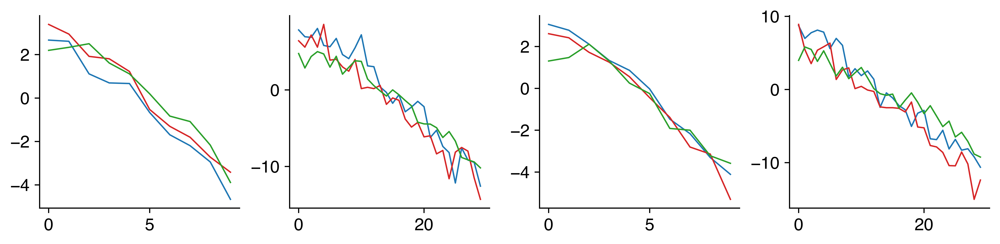

In [31]:
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
rois = ['Hippocampus', 'MTL', 'Cortex']

plt.close()
fig, ax = plt.subplots(1, 4, figsize=(12, 2.5), dpi=1200)
ax = np.ravel(ax)

for iax, game_state in enumerate(game_states):
    for roi in rois:
        ax[iax].plot(df.query("(gameState=='{}') & (unit_group=='{}')".format(game_state, roi)).iloc[0]['error_dist'])

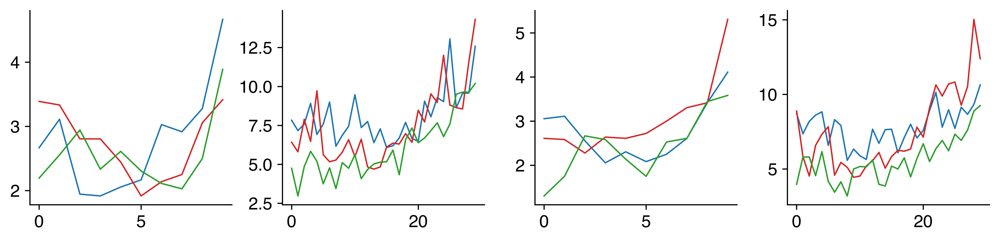

In [32]:
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
rois = ['Hippocampus', 'MTL', 'Cortex']

plt.close()
fig, ax = plt.subplots(1, 4, figsize=(12, 2.5), dpi=1200)
ax = np.ravel(ax)

for iax, game_state in enumerate(game_states):
    for roi in rois:
        ax[iax].plot(df.query("(gameState=='{}') & (unit_group=='{}')".format(game_state, roi)).iloc[0]['abs_error_dist'])

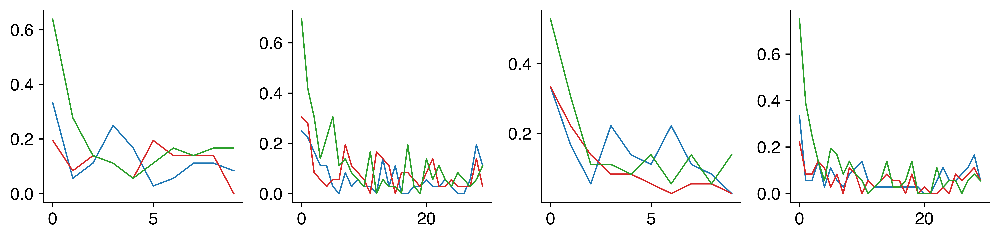

In [33]:
game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
rois = ['Hippocampus', 'MTL', 'Cortex']

plt.close()
fig, ax = plt.subplots(1, 4, figsize=(12, 2.5), dpi=1200)
ax = np.ravel(ax)

for iax, game_state in enumerate(game_states):
    for roi in rois:
        ax[iax].plot(df.query("(gameState=='{}') & (unit_group=='{}')".format(game_state, roi)).iloc[0]['acc_by_time'])